<h1><span style="color:blue">AI Final Course Project - Smoke Detection</span></h1>

<br></br>
## Introduction

Binary classification using Tensorflow/Keras is an important part of 
machine learning used to identify and distinguish between two distinct 
classes. Smoke detection is a critical problem in public safety, and 
detecting smoke early can help prevent fires and save lives. Machine 
learning models can be trained to recognize patterns in images that correspond to smoke, which can be used to classify new images as containing smoke or not. Tensorflow/Keras simplifies building machine learning models, and the problem of smoke detection can be solved using various techniques.

## Dataset Source

The dataset used in this AI project was sourced from Kaggle, a popular online community of data scientists and machine learning practitioners.

<br></br>
<h2> Loading Python Libraries </h2>

In [1]:
# Let's import the required python packages for next day rain predict
import shap
import random
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from pandas_profiling import ProfileReport
from lime.lime_tabular import LimeTabularExplainer

%matplotlib inline

# Tensorflow/Keras imports
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.


<br></br>
## Importing the Data

In [2]:
# Let's load the smoke detection data into a dataframe using pandas
data_frame = pd.read_csv("smoke_detection.csv", index_col=0)
plot_data_frame = data_frame.copy()

# Let's take a quick look at the shape of the dataframe
print("Smoke detection data shape -->", data_frame.shape)
print()

# Let's take a brief look at the contents of the dataframe
data_frame.head(10)

Smoke detection data shape --> (62630, 15)



,UTC,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
0,1654733331,20.000,57.36,0,400,12306,18520,939.735,0.0,0.00,0.0,0.000,0.00,0,0
1,1654733332,20.015,56.67,0,400,12345,18651,939.744,0.0,0.00,0.0,0.000,0.00,1,0
2,1654733333,20.029,55.96,0,400,12374,18764,939.738,0.0,0.00,0.0,0.000,0.00,2,0
3,1654733334,20.044,55.28,0,400,12390,18849,939.736,0.0,0.00,0.0,0.000,0.00,3,0
4,1654733335,20.059,54.69,0,400,12403,18921,939.744,0.0,0.00,0.0,0.000,0.00,4,0
5,1654733336,20.073,54.12,0,400,12419,18998,939.725,0.0,0.00,0.0,0.000,0.00,5,0
6,1654733337,20.088,53.61,0,400,12432,19058,939.738,0.0,0.00,0.0,0.000,0.00,6,0
7,1654733338,20.103,53.20,0,400,12439,19114,939.758,0.0,0.00,0.0,0.000,0.00,7,0
8,1654733339,20.117,52.81,0,400,12448,19155,939.758,0.0,0.00,0.0,0.000,0.00,8,0
9,1654733340,20.132,52.46,0,400,12453,19195,939.756,0.9,3.78,0.0,4.369,2.78,9,0


<br></br>
## Gaining Insights from Data

In [3]:
# Let's obtain a brief overview of the dataframe
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 62630 entries, 0 to 62629
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   UTC             62630 non-null  int64  
 1   Temperature[C]  62630 non-null  float64
 2   Humidity[%]     62630 non-null  float64
 3   TVOC[ppb]       62630 non-null  int64  
 4   eCO2[ppm]       62630 non-null  int64  
 5   Raw H2          62630 non-null  int64  
 6   Raw Ethanol     62630 non-null  int64  
 7   Pressure[hPa]   62630 non-null  float64
 8   PM1.0           62630 non-null  float64
 9   PM2.5           62630 non-null  float64
 10  NC0.5           62630 non-null  float64
 11  NC1.0           62630 non-null  float64
 12  NC2.5           62630 non-null  float64
 13  CNT             62630 non-null  int64  
 14  Fire Alarm      62630 non-null  int64  
dtypes: float64(8), int64(7)
memory usage: 7.6 MB


In [4]:
# Let's see descriptive statistics for all numeric columns
data_frame.describe()

,UTC,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
count,6.263000e+04,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000
mean,1.654792e+09,15.970424,48.539499,1942.057528,670.021044,12942.453936,19754.257912,938.627649,100.594309,184.467770,491.463608,203.586487,80.049042,10511.386157,0.714626
std,1.100025e+05,14.359576,8.865367,7811.589055,1905.885439,272.464305,609.513156,1.331344,922.524245,1976.305615,4265.661251,2214.738556,1083.383189,7597.870997,0.451596
min,1.654712e+09,-22.010000,10.740000,0.000000,400.000000,10668.000000,15317.000000,930.852000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.654743e+09,10.994250,47.530000,130.000000,400.000000,12830.000000,19435.000000,938.700000,1.280000,1.340000,8.820000,1.384000,0.033000,3625.250000,0.000000
50%,1.654762e+09,20.130000,50.150000,981.000000,400.000000,12924.000000,19501.000000,938.816000,1.810000,1.880000,12.450000,1.943000,0.044000,9336.000000,1.000000
75%,1.654778e+09,25.409500,53.240000,1189.000000,438.000000,13109.000000,20078.000000,939.418000,2.090000,2.180000,14.420000,2.249000,0.051000,17164.750000,1.000000
max,1.655130e+09,59.930000,75.200000,60000.000000,60000.000000,13803.000000,21410.000000,939.861000,14333.690000,45432.260000,61482.030000,51914.680000,30026.438000,24993.000000,1.000000


### Observations
1. The values in the Temperature column include negative numbers.
2. Datapoints in TVOC, eCO2, PM2.5, NC0.5 coulmns are more spread out or widely dispersed from the mean (average) of the values.

<br></br>
## Data Cleaning

In [5]:
# Let's drop the unnecessary columns like UTC and CNT, because UTC is the 
# time when experiment was performed and CNT is auto incremented value

data_frame.drop(["UTC", "CNT"], axis=1, inplace=True)

#### Check Duplicate Values

In [6]:
# Let's check for the duplicate values
data_frame[data_frame.duplicated(keep=False)]

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
51335,26.90,45.15,22,415,12846,20760,937.582,2.04,2.12,14.05,2.190,0.049,0
51385,27.12,44.50,55,412,12832,20717,937.571,2.15,2.23,14.80,2.308,0.052,0
57079,26.90,45.15,22,415,12846,20760,937.582,2.04,2.12,14.05,2.190,0.049,0
57129,27.12,44.50,55,412,12832,20717,937.571,2.15,2.23,14.80,2.308,0.052,0


#### Drop duplicate values

In [7]:
# Let's drop the duplicate values from the dataframe
data_frame = data_frame.drop_duplicates()

In [8]:
# Let's take a quick look at the shape of the dataframe
print("Smoke detection data shape -->", data_frame.shape)
print()

# Let's take a brief look at the contents of the dataframe
data_frame.head(10)

Smoke detection data shape --> (62628, 13)



,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
0,20.000,57.36,0,400,12306,18520,939.735,0.0,0.00,0.0,0.000,0.00,0
1,20.015,56.67,0,400,12345,18651,939.744,0.0,0.00,0.0,0.000,0.00,0
2,20.029,55.96,0,400,12374,18764,939.738,0.0,0.00,0.0,0.000,0.00,0
3,20.044,55.28,0,400,12390,18849,939.736,0.0,0.00,0.0,0.000,0.00,0
4,20.059,54.69,0,400,12403,18921,939.744,0.0,0.00,0.0,0.000,0.00,0
5,20.073,54.12,0,400,12419,18998,939.725,0.0,0.00,0.0,0.000,0.00,0
6,20.088,53.61,0,400,12432,19058,939.738,0.0,0.00,0.0,0.000,0.00,0
7,20.103,53.20,0,400,12439,19114,939.758,0.0,0.00,0.0,0.000,0.00,0
8,20.117,52.81,0,400,12448,19155,939.758,0.0,0.00,0.0,0.000,0.00,0
9,20.132,52.46,0,400,12453,19195,939.756,0.9,3.78,0.0,4.369,2.78,0


In [9]:
# Function to get unique_counts based on specific column
def value_counts(column_name):
    return data_frame.loc[
        :, column_name
    ].value_counts()  # Returns the unique value counts

In [10]:
# Iterates over all the columns of the dataframe and calls value_counts func
required_columns = [
    "Temperature[C]",
    "Humidity[%]",
    "eCO2[ppm]",
    "Fire Alarm",
]
for column_name in required_columns:
    print(f"Value Counts of {column_name}", sep="\n")
    print(value_counts(column_name=column_name))
    print()

Value Counts of Temperature[C]
 24.480    222
 24.510    206
 24.470    193
 26.950    191
 26.980    189
          ... 
 24.866      1
 14.089      1
-8.907       1
 14.099      1
 16.957      1
Name: Temperature[C], Length: 21672, dtype: int64

Value Counts of Humidity[%]
47.50    130
47.45    130
47.86    126
53.12    126
47.76    126
        ... 
32.07      1
31.77      1
31.59      1
31.35      1
21.61      1
Name: Humidity[%], Length: 3890, dtype: int64

Value Counts of eCO2[ppm]
400     31922
404       942
401       925
406       918
408       896
        ...  
2231        1
1436        1
1602        1
2501        1
1844        1
Name: eCO2[ppm], Length: 1713, dtype: int64

Value Counts of Fire Alarm
1    44757
0    17871
Name: Fire Alarm, dtype: int64



### See how many missing data points we have

In [11]:
# Let's get the number of missing data points per column
data_frame.isnull().sum()

Temperature[C]    0
Humidity[%]       0
TVOC[ppb]         0
eCO2[ppm]         0
Raw H2            0
Raw Ethanol       0
Pressure[hPa]     0
PM1.0             0
PM2.5             0
NC0.5             0
NC1.0             0
NC2.5             0
Fire Alarm        0
dtype: int64

<br></br>
### Missing data points visualization

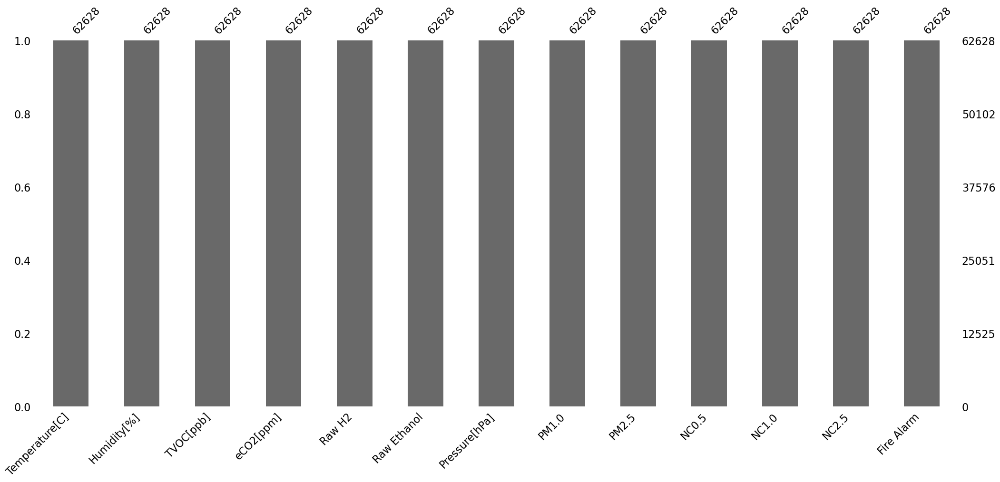

In [12]:
# Let's visualize the missing points using barplot
msno.bar(data_frame)
plt.show()

<br></br>
## Feature Engineering

### Oversampling

In [13]:
# Let's increase the number of data instances associated with label 0 in the 
# FireAlarm feature by oversampling, relative to those with label 1.

oversample = SMOTE()
X_smote, y_smote = oversample.fit_resample(data_frame.iloc[:, :-1].values, data_frame.iloc[:, -1].values)

# Let's create a dataframe by merging X_smote and y_smote
X_normalized_df = pd.DataFrame(X_smote, columns = data_frame.columns.tolist()[:-1])
y_normalized_df = pd.DataFrame(y_smote, columns=["Fire Alarm"])
normalized_dataframe = pd.concat([X_normalized_df, y_normalized_df], axis = 1)

<br></br>
#### Count Plot of Fire Alarm Label - Before Sampling

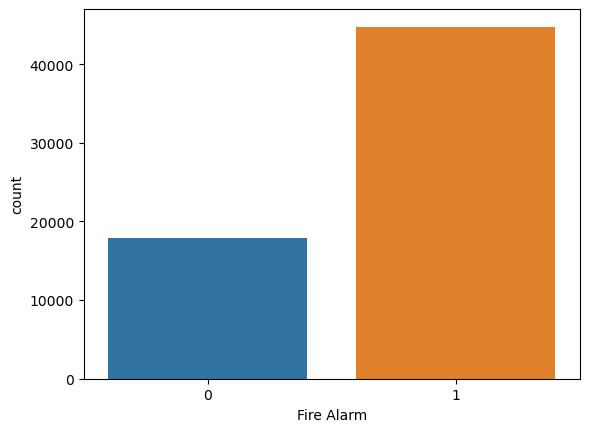

In [14]:
# Let's plot the counts of output labels using the countplot
sns.countplot(data=data_frame, x="Fire Alarm")
plt.show()

#### Count Plot of Fire Alarm Label - After Sampling

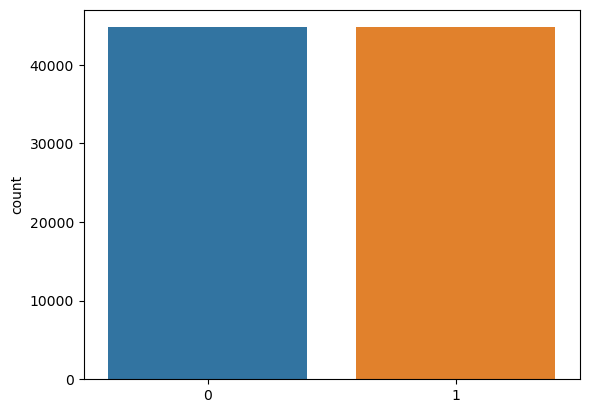

In [15]:
# Let's plot the counts of output labels using the countplot
sns.countplot(x=y_smote)
plt.show()

### Output Column Distribution

In [16]:
# Let's see the percentage of 0's and 1's in output column(RainTomorrow)
percentage = data_frame.loc[:, "Fire Alarm"].value_counts(normalize=True) * 100
percentage

1    71.46484
0    28.53516
Name: Fire Alarm, dtype: float64

#### Pie chart distribution - Before Sampling

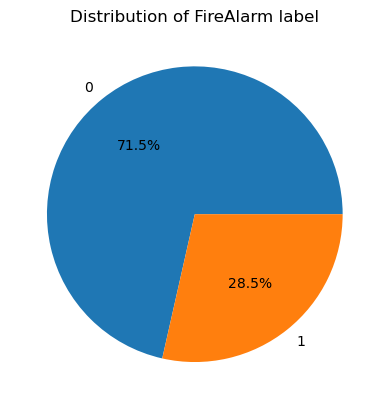

In [17]:
plt.pie(percentage, labels=["0", "1"], autopct="%1.1f%%")
plt.title("Distribution of FireAlarm label")
plt.show()

In [18]:
# Let's see the percentage of 0's and 1's in output column(RainTomorrow)
percentage = normalized_dataframe.loc[:, "Fire Alarm"].value_counts(normalize=True) * 100
percentage

0    50.0
1    50.0
Name: Fire Alarm, dtype: float64

#### Pie chart distribution - After Sampling

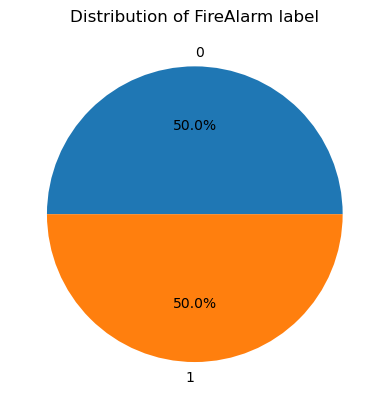

In [19]:
plt.pie(percentage, labels=["0", "1"], autopct="%1.1f%%")
plt.title("Distribution of FireAlarm label")
plt.show()

<br></br>
## Data Normalization

In [20]:
# Function to normalize the values of each column by subtracting
# the mean and dividing by the standard deviation

def z_score_normalization(column_name):
    series = data_frame.loc[:, column_name]
    return (series - series.mean()) / series.std()

In [21]:
# Iterates over all the continuous columns and applies z_score_normalization to each column
for column_name in data_frame.columns:
    if column_name != "Fire Alarm":
        data_frame[column_name] = z_score_normalization(column_name=column_name)

#### Descriptive statisctics after normalization

In [22]:
# Let's see descriptive statistics for all numeric columns after normalization
data_frame.head()

,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,Fire Alarm
0,0.280642,0.994913,-0.248616,-0.14168,-2.335897,-2.024990,0.831724,-0.109044,-0.093341,-0.115216,-0.091925,-0.073889,0
1,0.281687,0.917083,-0.248616,-0.14168,-2.192761,-1.810059,0.838484,-0.109044,-0.093341,-0.115216,-0.091925,-0.073889,0
2,0.282662,0.836997,-0.248616,-0.14168,-2.086326,-1.624660,0.833977,-0.109044,-0.093341,-0.115216,-0.091925,-0.073889,0
3,0.283706,0.760295,-0.248616,-0.14168,-2.027604,-1.485201,0.832475,-0.109044,-0.093341,-0.115216,-0.091925,-0.073889,0
4,0.284751,0.693745,-0.248616,-0.14168,-1.979892,-1.367071,0.838484,-0.109044,-0.093341,-0.115216,-0.091925,-0.073889,0


<br></br>
## Data Visualizations(Distributions)

#### Histogram plots before normalization

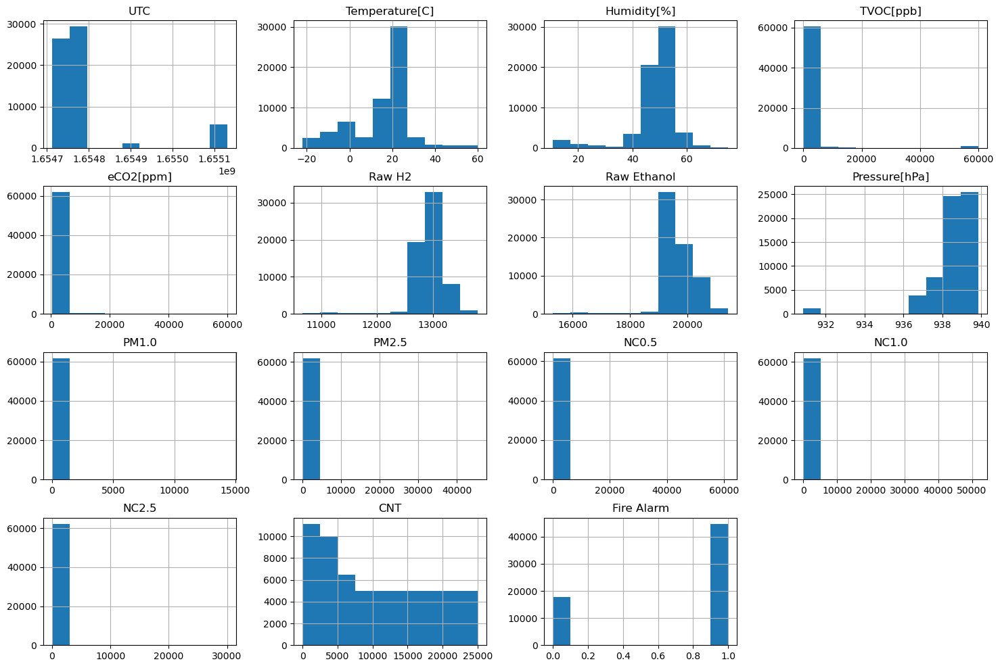

In [23]:
# Let's see the distributions of all the features in a dataframe using histogram plots
plot_data_frame.hist(bins=10, figsize=(18, 12))
plt.show()

#### Box plots before normalization

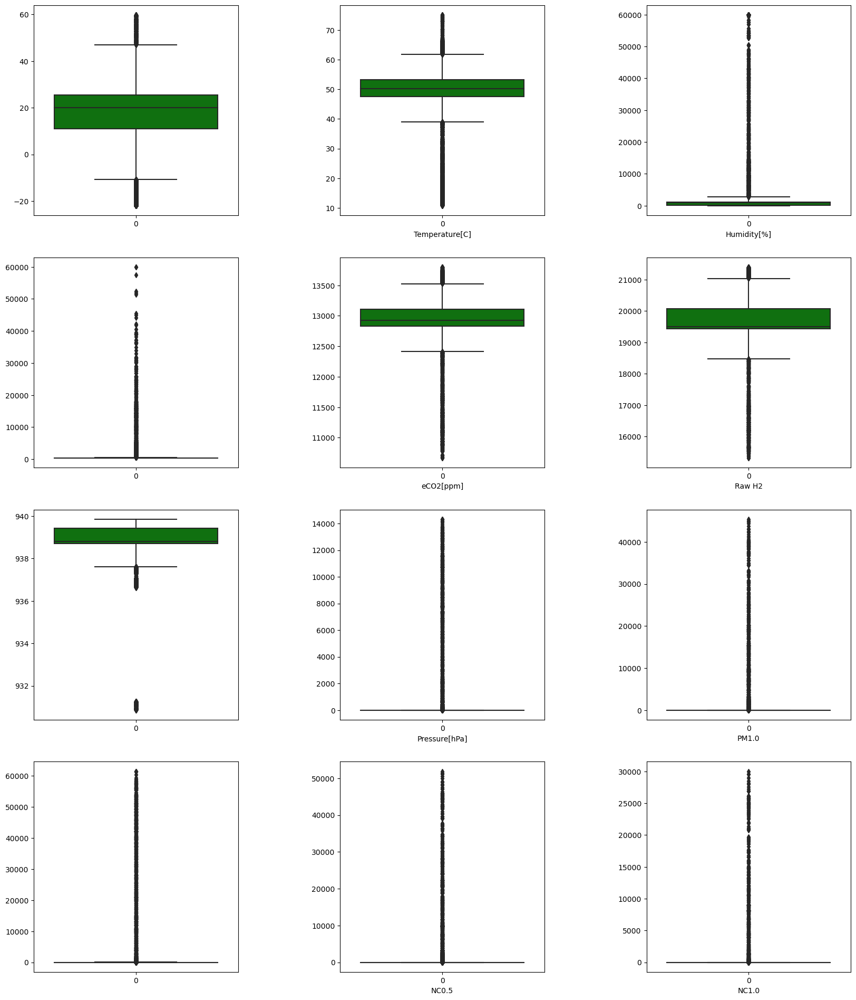

In [24]:
# Let's confirm that all values in a dataframe are within the range of 0 to 1 using boxplots
row = 0
column = 0
nrow_plots = 5
ncol_plots = 3
figure, axis = plt.subplots(nrow_plots, ncol_plots, figsize=(20, 30))
plt.subplots_adjust(wspace=0.5)
for column_name in data_frame.columns:
    sns.boxplot(data=plot_data_frame[column_name], ax=axis[row][column], color="green")
    if column < ncol_plots - 1:
        column += 1
        axis[row][column].set_xlabel(column_name)
    else:
        row += 1
        column = 0

# # Let's remove empty subplot
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 1])
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 2])
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 3])

#### Histogram plots after normalization

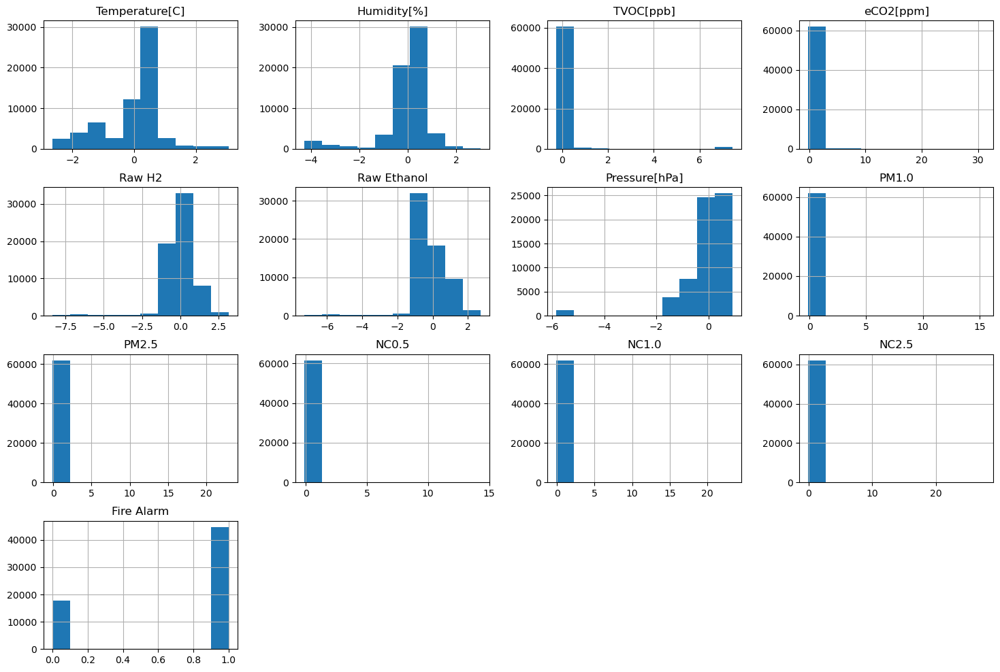

In [25]:
# Let's confirm that all values in a dataframe are within the range of 0 to 1 using histplots
# plt.figure(figsize=(20, 12))
data_frame.hist(bins=10, figsize=(18, 12))
plt.show()

#### Box plots after normalization

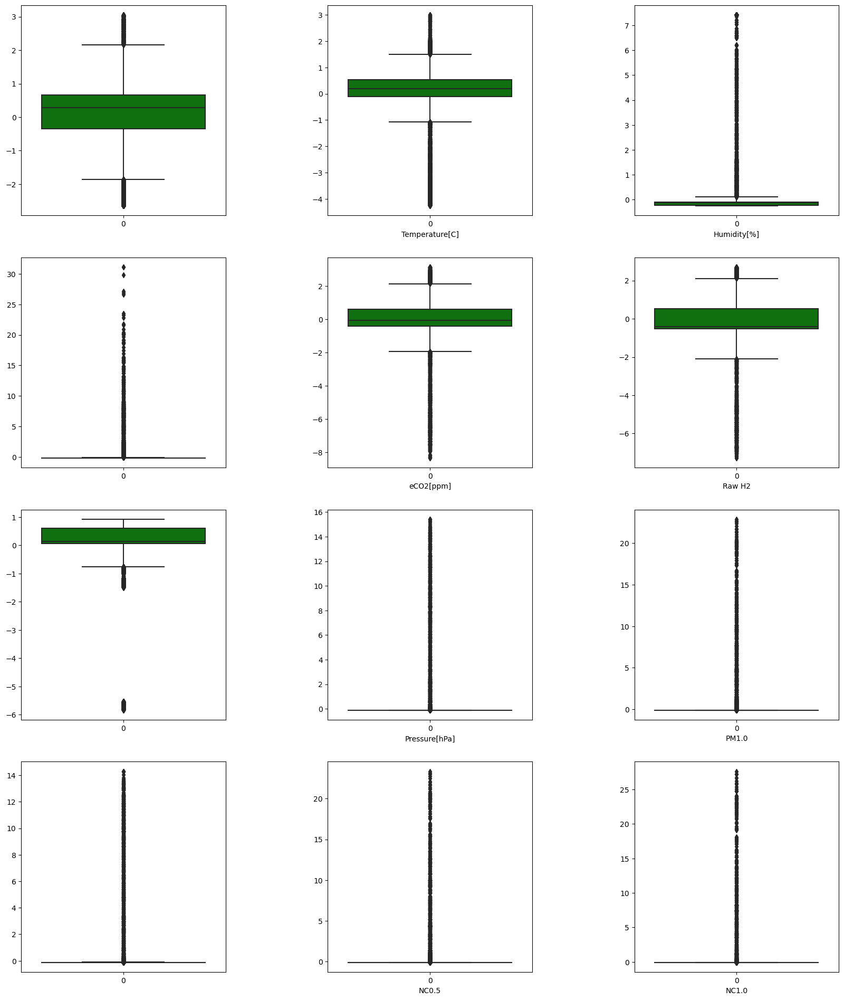

In [26]:
# Let's confirm that all values in a dataframe are within the range of 0 to 1 using boxplots
row = 0
column = 0
nrow_plots = 5
ncol_plots = 3
figure, axis = plt.subplots(nrow_plots, ncol_plots, figsize=(20, 30))
plt.subplots_adjust(wspace=0.5)
for column_name in data_frame.columns:
    sns.boxplot(data=data_frame[column_name], ax=axis[row][column], color="green")
    if column < ncol_plots - 1:
        column += 1
        axis[row][column].set_xlabel(column_name)
    else:
        row += 1
        column = 0

# # Let's remove empty subplot
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 1])
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 2])
figure.delaxes(axis[nrow_plots - 1][ncol_plots - 3])

### Pandas Profiling

In [27]:
# Let's generate and display the pandas_profile of the entire rain dataframe
profile = ProfileReport(data_frame)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<br></br>
## Phase - 2 Build a model to overfit the entire dataset)

In [28]:
# Let's define a function to plot the loss and accuracy
def plot_loss_accuracy(model_name, model, model_history):
    figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    figure.suptitle(model_name)
    ax1.plot(model_history.history["loss"])
    ax1.set_ylabel("loss")
    ax1.set_xlabel("epoch")
    ax1.legend(["Overall loss data"], loc="best")

    ax2.plot(model_history.history["accuracy"])
    ax2.set_ylabel("accuracy")
    ax2.set_xlabel("epoch")
    ax2.legend(["Overall accuracy data"], loc="best")
    figure.show()

#### Model Building with one layer and one neuron (1-1) and 20 epochs

In [29]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layer to the model network
model.add(Dense(1, input_dim=data_frame.shape[1] - 1, activation="sigmoid"))

2023-05-09 00:04:41.066101: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:267] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [30]:
# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process

model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [31]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=20, verbose=1)

Epoch 1/20
2798/2798 [==============================] - 3s 821us/step - loss: 219.0697 - accuracy: 0.7485
Epoch 2/20
2798/2798 [==============================] - 2s 821us/step - loss: 26.6872 - accuracy: 0.7787
Epoch 3/20
2798/2798 [==============================] - 2s 814us/step - loss: 14.7462 - accuracy: 0.7829
Epoch 4/20
2798/2798 [==============================] - 2s 818us/step - loss: 7.1313 - accuracy: 0.7913
Epoch 5/20
2798/2798 [==============================] - 2s 826us/step - loss: 5.5498 - accuracy: 0.7926
Epoch 6/20
2798/2798 [==============================] - 2s 837us/step - loss: 5.4974 - accuracy: 0.7956
Epoch 7/20
2798/2798 [==============================] - 2s 843us/step - loss: 5.1337 - accuracy: 0.7966
Epoch 8/20
2798/2798 [==============================] - 2s 820us/step - loss: 5.1542 - accuracy: 0.7995
Epoch 9/20
2798/2798 [==============================] - 2s 845us/step - loss: 5.1432 - accuracy: 0.8026
Epoch 10/20
2798/2798 [==============================] - 2s 

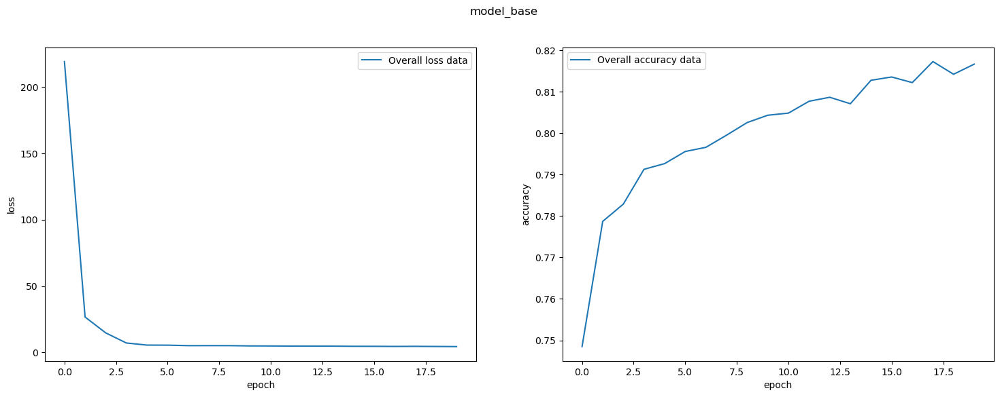

In [32]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_base", model=model, model_history=history)

### Observations
If the training accuracy of a neural network is improving gradually, one option to potentially improve it further is to increase the number of epochs or increase the complexity of the model architecture by adding more layers and neurons

<br></br>
#### Model Building with one layer and one neuron (1-1) and 50 epochs

In [33]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layer to the model network
model.add(Dense(1, input_dim=data_frame.shape[1] - 1, activation="sigmoid"))

In [34]:
# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process

model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [35]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 3s 822us/step - loss: 647.4402 - accuracy: 0.5564
Epoch 2/50
2798/2798 [==============================] - 2s 821us/step - loss: 9.7232 - accuracy: 0.8102
Epoch 3/50
2798/2798 [==============================] - 2s 821us/step - loss: 3.7189 - accuracy: 0.8175
Epoch 4/50
2798/2798 [==============================] - 2s 848us/step - loss: 3.5089 - accuracy: 0.8195
Epoch 5/50
2798/2798 [==============================] - 2s 863us/step - loss: 3.5129 - accuracy: 0.8195
Epoch 6/50
2798/2798 [==============================] - 2s 820us/step - loss: 3.5580 - accuracy: 0.8176
Epoch 7/50
2798/2798 [==============================] - 2s 825us/step - loss: 3.5295 - accuracy: 0.8198
Epoch 8/50
2798/2798 [==============================] - 2s 823us/step - loss: 3.5048 - accuracy: 0.8189
Epoch 9/50
2798/2798 [==============================] - 2s 825us/step - loss: 3.5021 - accuracy: 0.8177
Epoch 10/50
2798/2798 [==============================] - 2s 82

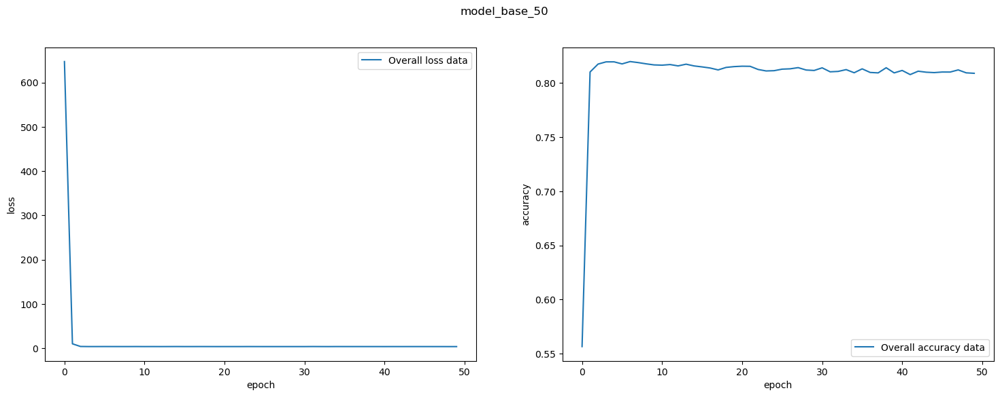

In [36]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_base_50", model=model, model_history=history)

### Observations
If the training accuracy of a neural network is improving gradually, one option to potentially improve it further is to increase the number of epochs or increase the complexity of the model architecture by adding more layers and neurons

<br></br>
#### Model Building with one layer and one neuron (1-1) and 100 epochs

In [37]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layer to the model network
model.add(Dense(1, input_dim=data_frame.shape[1] - 1, activation="sigmoid"))

In [38]:
# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process

model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [39]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 3s 832us/step - loss: 403.4251 - accuracy: 0.6656
Epoch 2/100
2798/2798 [==============================] - 2s 818us/step - loss: 23.6685 - accuracy: 0.7387
Epoch 3/100
2798/2798 [==============================] - 2s 820us/step - loss: 17.1656 - accuracy: 0.7481
Epoch 4/100
2798/2798 [==============================] - 2s 818us/step - loss: 11.0080 - accuracy: 0.7486
Epoch 5/100
2798/2798 [==============================] - 2s 824us/step - loss: 7.0911 - accuracy: 0.7395
Epoch 6/100
2798/2798 [==============================] - 2s 835us/step - loss: 6.3712 - accuracy: 0.7413
Epoch 7/100
2798/2798 [==============================] - 2s 825us/step - loss: 6.2918 - accuracy: 0.7424
Epoch 8/100
2798/2798 [==============================] - 2s 823us/step - loss: 6.1156 - accuracy: 0.7457
Epoch 9/100
2798/2798 [==============================] - 2s 827us/step - loss: 6.0251 - accuracy: 0.7474
Epoch 10/100
2798/2798 [==========================

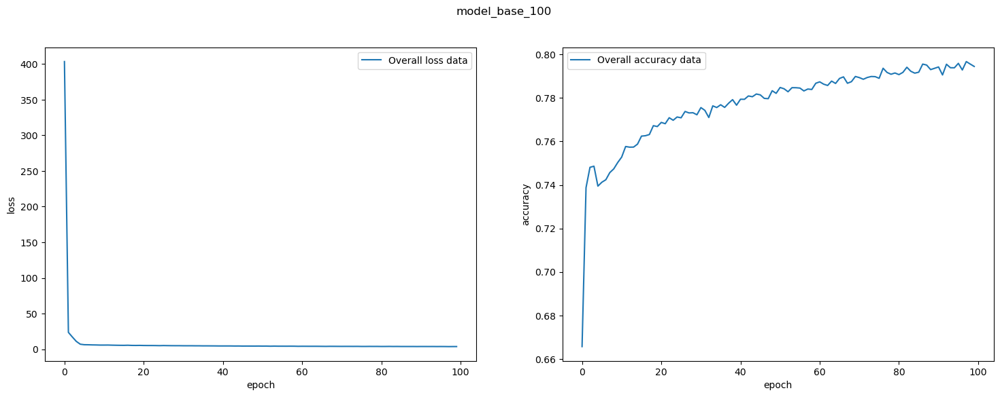

In [40]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_base_100", model=model, model_history=history)

### Observations
The neural network's training accuracy is gradually improving, one possible way to enhance it further is by increasing the number of training epochs.

<br></br>
#### Model Building with one layer and one neuron (1-1) and 200 epochs

In [41]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layer to the model network
model.add(Dense(1, input_dim=data_frame.shape[1] - 1, activation="sigmoid"))

In [42]:
# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process

model.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [43]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=200, verbose=1)

Epoch 1/200
2798/2798 [==============================] - 3s 826us/step - loss: 69.2802 - accuracy: 0.2901
Epoch 2/200
2798/2798 [==============================] - 2s 827us/step - loss: 12.1746 - accuracy: 0.4618
Epoch 3/200
2798/2798 [==============================] - 2s 828us/step - loss: 7.0137 - accuracy: 0.5854
Epoch 4/200
2798/2798 [==============================] - 2s 832us/step - loss: 5.1221 - accuracy: 0.6685
Epoch 5/200
2798/2798 [==============================] - 2s 855us/step - loss: 4.6705 - accuracy: 0.7090
Epoch 6/200
2798/2798 [==============================] - 2s 858us/step - loss: 4.5758 - accuracy: 0.7284
Epoch 7/200
2798/2798 [==============================] - 2s 824us/step - loss: 4.4657 - accuracy: 0.7382
Epoch 8/200
2798/2798 [==============================] - 2s 824us/step - loss: 4.4499 - accuracy: 0.7464
Epoch 9/200
2798/2798 [==============================] - 2s 825us/step - loss: 4.3882 - accuracy: 0.7528
Epoch 10/200
2798/2798 [=============================

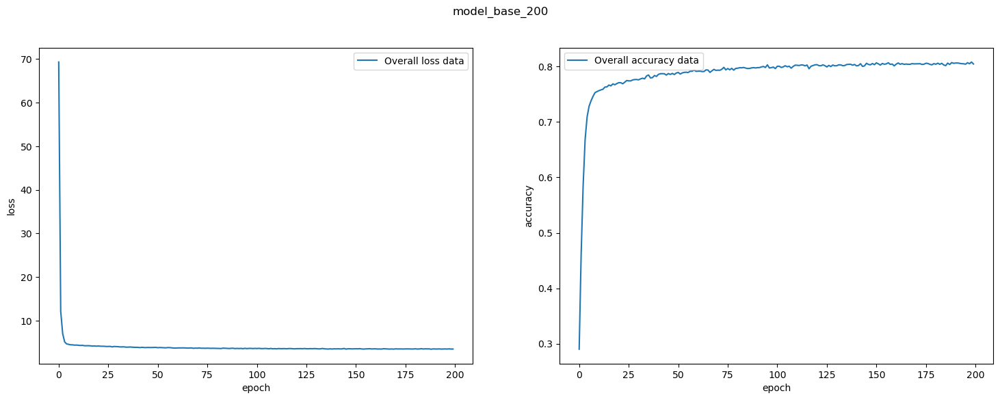

In [44]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_base_200", model=model, model_history=history)

### Observations
Despite 200 epochs of training, the neural network's accuracy is gradually improving in small increments. To further improve its performance, one option is to increase the complexity of the model architecture by incorporating additional layers and neurons.

<br></br>
#### Model Building with multiple layers and neurons (2-1) and 50 epochs

In [45]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(2, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [46]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 3s 954us/step - loss: 50.6170 - accuracy: 0.3177
Epoch 2/50
2798/2798 [==============================] - 3s 956us/step - loss: 2.6792 - accuracy: 0.6000
Epoch 3/50
2798/2798 [==============================] - 3s 943us/step - loss: 1.1750 - accuracy: 0.7520
Epoch 4/50
2798/2798 [==============================] - 3s 960us/step - loss: 1.1521 - accuracy: 0.7751
Epoch 5/50
2798/2798 [==============================] - 3s 958us/step - loss: 1.0369 - accuracy: 0.7884
Epoch 6/50
2798/2798 [==============================] - 3s 955us/step - loss: 1.0123 - accuracy: 0.8005
Epoch 7/50
2798/2798 [==============================] - 3s 961us/step - loss: 0.9853 - accuracy: 0.8048
Epoch 8/50
2798/2798 [==============================] - 3s 947us/step - loss: 0.9137 - accuracy: 0.8121
Epoch 9/50
2798/2798 [==============================] - 3s 948us/step - loss: 0.9651 - accuracy: 0.8143
Epoch 10/50
2798/2798 [==============================] - 3s 957

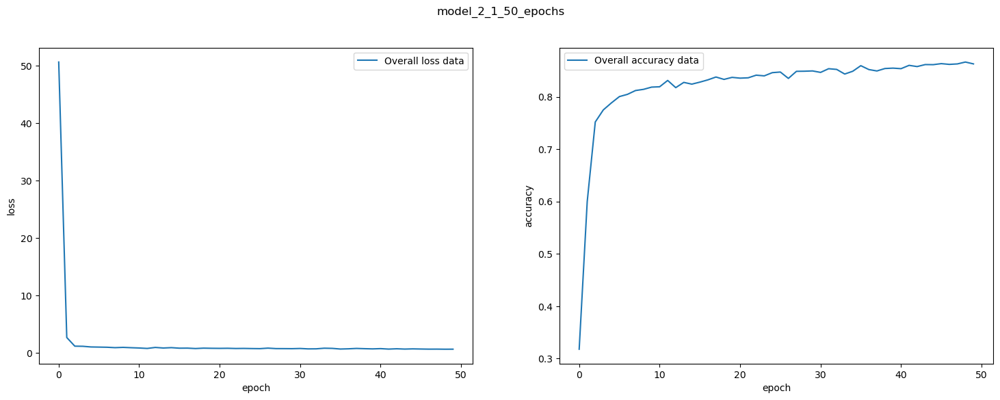

In [47]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_2_1_50_epochs", model=model, model_history=history)

### Observations
The current neural network architecture has two layers with 2 and 1 neurons in each layer, and it is not showing signs of overfitting with 50 epochs. Therefore, it may be worth considering increasing the size of the sequential model network or number of epochs to potentially improve its performance further.

<br></br>
#### Model Building with multiple layers and neurons (2-1) and 100 epochs

In [50]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(2, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [51]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 3s 964us/step - loss: 230.6059 - accuracy: 0.3140
Epoch 2/100
2798/2798 [==============================] - 3s 953us/step - loss: 20.3735 - accuracy: 0.3863
Epoch 3/100
2798/2798 [==============================] - 3s 962us/step - loss: 3.5473 - accuracy: 0.6936
Epoch 4/100
2798/2798 [==============================] - 3s 956us/step - loss: 2.7848 - accuracy: 0.7584
Epoch 5/100
2798/2798 [==============================] - 3s 946us/step - loss: 2.5332 - accuracy: 0.7713
Epoch 6/100
2798/2798 [==============================] - 3s 957us/step - loss: 2.1089 - accuracy: 0.7871
Epoch 7/100
2798/2798 [==============================] - 3s 955us/step - loss: 1.8596 - accuracy: 0.7991
Epoch 8/100
2798/2798 [==============================] - 3s 965us/step - loss: 1.9122 - accuracy: 0.8026
Epoch 9/100
2798/2798 [==============================] - 3s 951us/step - loss: 1.7837 - accuracy: 0.8040
Epoch 10/100
2798/2798 [============================

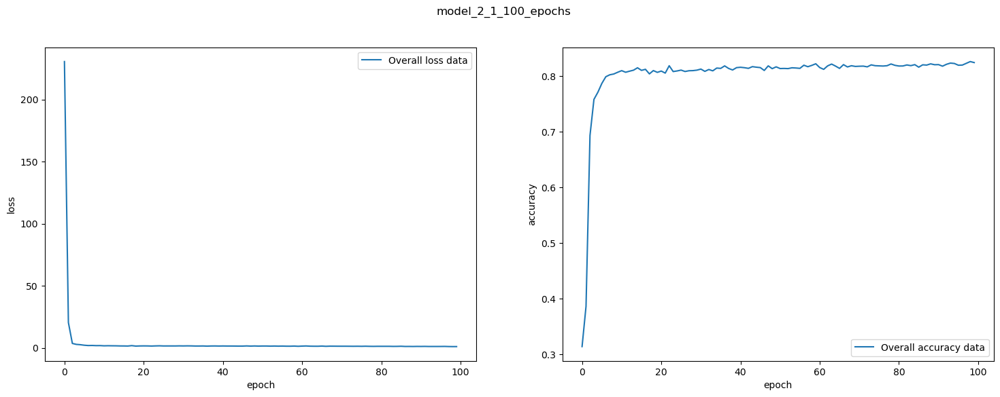

In [52]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_2_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network architecture has two layers with 2 and 1 neurons in each layer, and it is not showing signs of overfitting with 100 epochs. Therefore, it may be worth considering increasing the size of the sequential model network i.e to increase the number of neurons.

<br></br>
#### Model Building with multiple layers and neurons (4-1) and 50 epochs

In [57]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [58]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 4s 970us/step - loss: 120.1924 - accuracy: 0.4141
Epoch 2/50
2798/2798 [==============================] - 3s 962us/step - loss: 1.7123 - accuracy: 0.8073
Epoch 3/50
2798/2798 [==============================] - 3s 965us/step - loss: 1.2568 - accuracy: 0.8480
Epoch 4/50
2798/2798 [==============================] - 3s 959us/step - loss: 1.1885 - accuracy: 0.8561
Epoch 5/50
2798/2798 [==============================] - 3s 969us/step - loss: 1.1438 - accuracy: 0.8585
Epoch 6/50
2798/2798 [==============================] - 3s 963us/step - loss: 1.0676 - accuracy: 0.8636
Epoch 7/50
2798/2798 [==============================] - 3s 965us/step - loss: 1.1185 - accuracy: 0.8596
Epoch 8/50
2798/2798 [==============================] - 3s 964us/step - loss: 1.0611 - accuracy: 0.8597
Epoch 9/50
2798/2798 [==============================] - 3s 959us/step - loss: 0.9655 - accuracy: 0.8579
Epoch 10/50
2798/2798 [==============================] - 3s 96

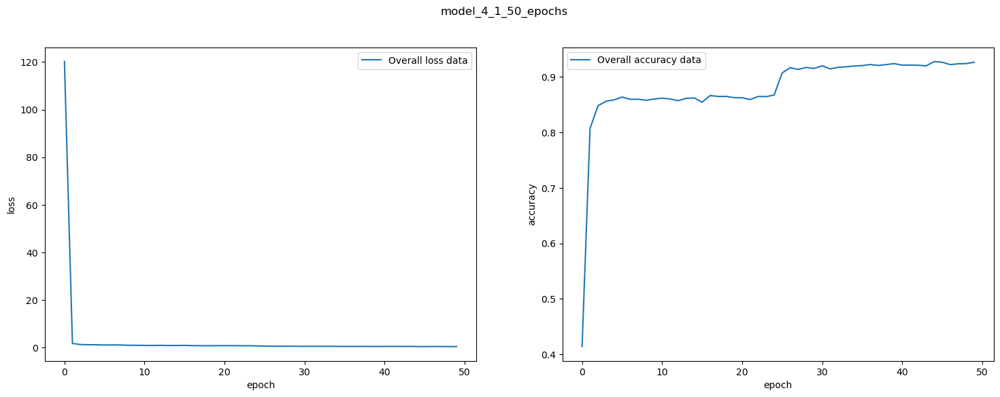

In [59]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_1_50_epochs", model=model, model_history=history)

### Observations
The current neural network architecture has two layers with 2 and 1 neurons in each layer, and it is not showing signs of overfitting with 50 epochs. Therefore, it may be worth considering increasing the number of epochs to potentially improve its performance further.

<br></br>
#### Model Building with multiple layers and neurons (4-1) and 100 epochs

In [66]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [67]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 3s 964us/step - loss: 99.1253 - accuracy: 0.4849
Epoch 2/100
2798/2798 [==============================] - 3s 953us/step - loss: 3.6486 - accuracy: 0.7797
Epoch 3/100
2798/2798 [==============================] - 3s 942us/step - loss: 1.4164 - accuracy: 0.8266
Epoch 4/100
2798/2798 [==============================] - 3s 951us/step - loss: 0.9565 - accuracy: 0.8432
Epoch 5/100
2798/2798 [==============================] - 3s 959us/step - loss: 1.0559 - accuracy: 0.8427
Epoch 6/100
2798/2798 [==============================] - 3s 951us/step - loss: 1.0512 - accuracy: 0.8430
Epoch 7/100
2798/2798 [==============================] - 3s 962us/step - loss: 1.0205 - accuracy: 0.8480
Epoch 8/100
2798/2798 [==============================] - 3s 944us/step - loss: 1.1111 - accuracy: 0.8474
Epoch 9/100
2798/2798 [==============================] - 3s 958us/step - loss: 0.9577 - accuracy: 0.8558
Epoch 10/100
2798/2798 [==============================

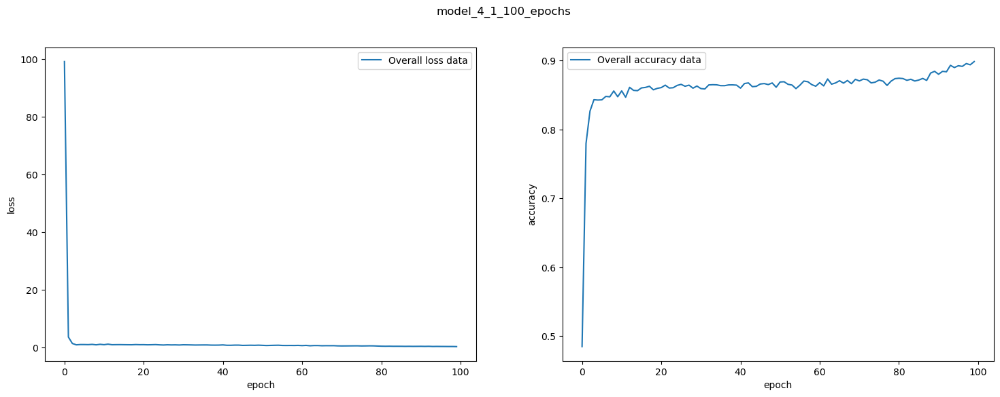

In [68]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has a simple architecture with only two layers, containing 4 and 1 neurons respectively. Despite achieving a steady increase in accuracy, further increasing the number of epochs is unlikely to lead to overfitting. Therefore, to improve performance, it may be necessary to consider expanding the network architecture by adding more layers or increasing the number of neurons.

<br></br>
#### Model Building with multiple layers and neurons (8-1) and 50 epochs

In [69]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [70]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 3s 962us/step - loss: 327.3688 - accuracy: 0.8231
Epoch 2/50
2798/2798 [==============================] - 3s 972us/step - loss: 0.7520 - accuracy: 0.8771
Epoch 3/50
2798/2798 [==============================] - 3s 964us/step - loss: 0.7503 - accuracy: 0.8873
Epoch 4/50
2798/2798 [==============================] - 3s 968us/step - loss: 0.7330 - accuracy: 0.8853
Epoch 5/50
2798/2798 [==============================] - 3s 967us/step - loss: 0.6833 - accuracy: 0.8919
Epoch 6/50
2798/2798 [==============================] - 3s 961us/step - loss: 0.6962 - accuracy: 0.8875
Epoch 7/50
2798/2798 [==============================] - 3s 958us/step - loss: 0.6582 - accuracy: 0.8840
Epoch 8/50
2798/2798 [==============================] - 3s 973us/step - loss: 0.6472 - accuracy: 0.8837
Epoch 9/50
2798/2798 [==============================] - 3s 997us/step - loss: 0.6130 - accuracy: 0.8925
Epoch 10/50
2798/2798 [==============================] - 3s 1m

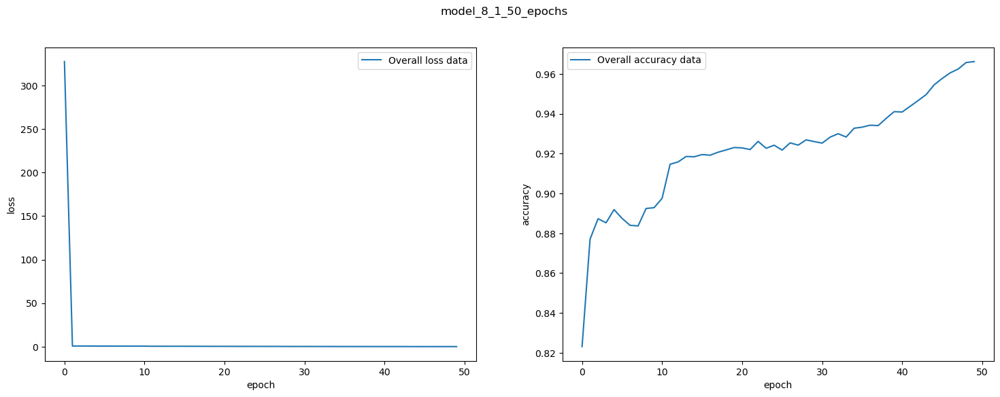

In [71]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_1_50_epochs", model=model, model_history=history)

### Observations
The current neural network architecture has two layers with 8 and 1 neurons in each layer, and it is not showing signs of overfitting with 50 epochs. Therefore, it may be worth considering increasing the number of epochs to 100 which might potentially improve the accuracy.

<br></br>
#### Model Building with multiple layers and neurons (8-1) and 100 epochs

In [72]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [73]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 3s 957us/step - loss: 30.9792 - accuracy: 0.7061
Epoch 2/100
2798/2798 [==============================] - 3s 966us/step - loss: 3.1505 - accuracy: 0.8236
Epoch 3/100
2798/2798 [==============================] - 3s 968us/step - loss: 2.7869 - accuracy: 0.8348
Epoch 4/100
2798/2798 [==============================] - 3s 973us/step - loss: 2.5747 - accuracy: 0.8438
Epoch 5/100
2798/2798 [==============================] - 3s 960us/step - loss: 2.4737 - accuracy: 0.8506
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 2.4850 - accuracy: 0.8515
Epoch 7/100
2798/2798 [==============================] - 3s 982us/step - loss: 2.8407 - accuracy: 0.8439
Epoch 8/100
2798/2798 [==============================] - 3s 966us/step - loss: 2.3815 - accuracy: 0.8566
Epoch 9/100
2798/2798 [==============================] - 3s 960us/step - loss: 2.3204 - accuracy: 0.8581
Epoch 10/100
2798/2798 [==============================] 

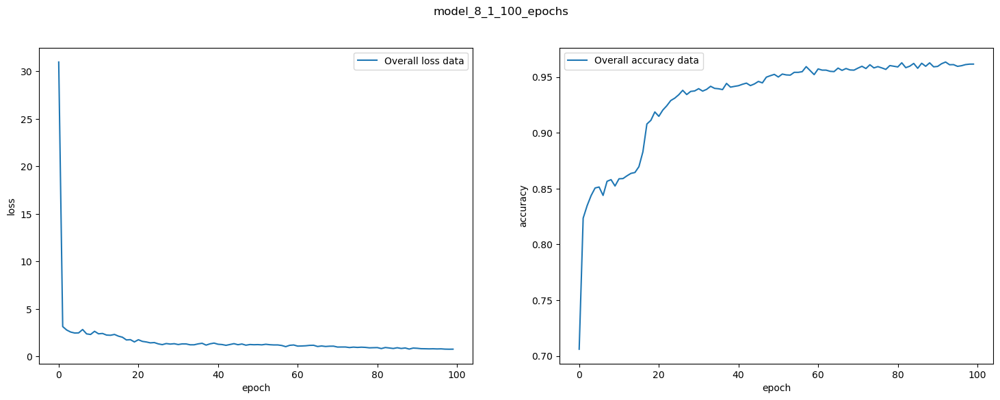

In [74]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_1_100_epochs", model=model, model_history=history)

### Observations
Based on the fact that the current neural network architecture, which consists of two layers with 8 and 1 neurons, is not achieving 100 percent convergence even after 100 epochs, it might be worth exploring the option of increasing the size of the neural network by adding more layers and neurons.

<br></br>
#### Model Building with multiple layers and neurons (4-4-1) and 50 epochs

In [81]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(4, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [82]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 4s 1ms/step - loss: 21.3935 - accuracy: 0.3716
Epoch 2/50
2798/2798 [==============================] - 3s 1ms/step - loss: 1.6386 - accuracy: 0.6124
Epoch 3/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6509 - accuracy: 0.7891
Epoch 4/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5990 - accuracy: 0.8184
Epoch 5/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6168 - accuracy: 0.8255
Epoch 6/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5504 - accuracy: 0.8410
Epoch 7/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5436 - accuracy: 0.8404
Epoch 8/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5676 - accuracy: 0.8370
Epoch 9/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5173 - accuracy: 0.8482
Epoch 10/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.49

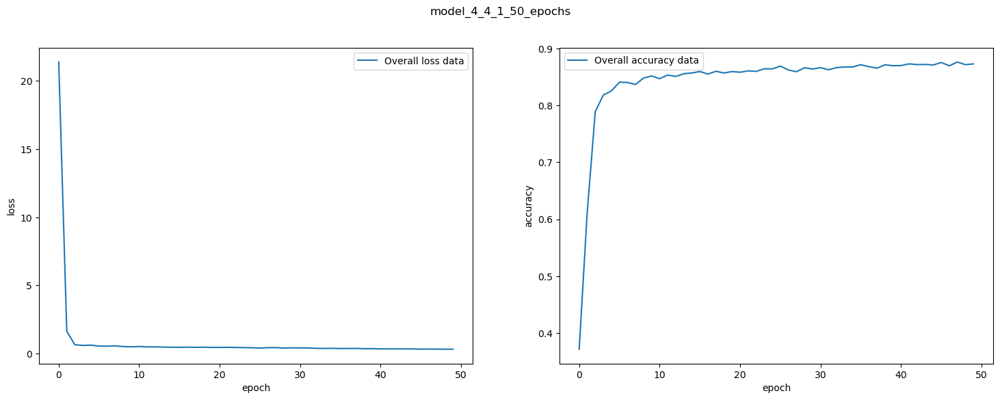

In [83]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_4_1_50_epochs", model=model, model_history=history)

### Observations
The neural network consists of three layers, each having 4, 4, and 1 neurons. The model has been trained for 50 rounds and achieved an accuracy of 0.8731, without exhibiting any issues related to overfitting or convergence. It is possible that increasing the number of epochs could result in overfitting.

<br></br>
#### Model Building with multiple layers and neurons (4-4-1) and 100 epochs

In [92]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(4, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [93]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 1.6053 - accuracy: 0.7265
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5742 - accuracy: 0.8089
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5149 - accuracy: 0.8273
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5549 - accuracy: 0.8304
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4761 - accuracy: 0.8474
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4137 - accuracy: 0.8614
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3470 - accuracy: 0.9042
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3773 - accuracy: 0.9054
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3129 - accuracy: 0.9139
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - l

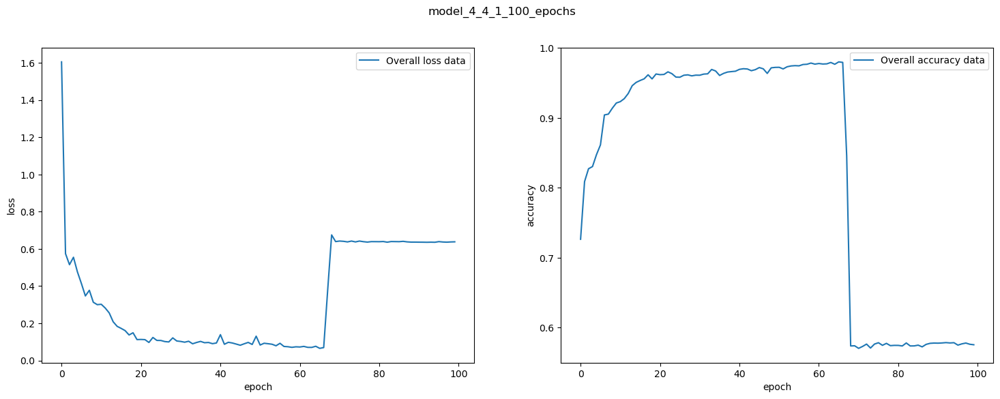

In [94]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_4_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 4, 4, and 1 neurons in each layer. It was trained for 100 epochs and achieved an accuracy of 0.9789, but accuracy is getting decreased after 50 epochs, overfitting was observed. Hence, it might be best to use 50 epochs as the optimal number for training the model. To improve the model's accuracy, we can increase the number of neurons and layers by modifying the model architecture.

<br></br>
#### Model Building with multiple layers and neurons (4-8-1) and 50 epochs

In [95]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [96]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 4s 1ms/step - loss: 1.9856 - accuracy: 0.5533
Epoch 2/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4305 - accuracy: 0.8305
Epoch 3/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2604 - accuracy: 0.8978
Epoch 4/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2301 - accuracy: 0.9116
Epoch 5/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2174 - accuracy: 0.9189
Epoch 6/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2056 - accuracy: 0.9236
Epoch 7/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1906 - accuracy: 0.9296
Epoch 8/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1772 - accuracy: 0.9367
Epoch 9/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1705 - accuracy: 0.9398
Epoch 10/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.158

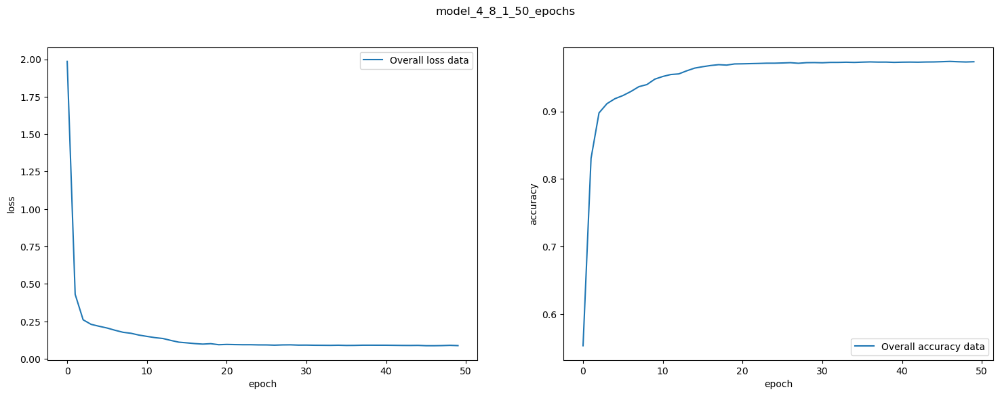

In [97]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_8_1_50_epochs", model=model, model_history=history)

### Observations
The neural network consists of three layers, each having 4, 8, and 1 neurons. The model has been trained for 50 rounds and achieved an accuracy of 0.9736, without exhibiting any issues related to overfitting or convergence. It is possible that increasing the number of epochs could result in overfitting.

<br></br>
#### Model Building with multiple layers and neurons (4-8-1) and 100 epochs

In [100]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(4, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [101]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 14.4210 - accuracy: 0.5008
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 2.8302 - accuracy: 0.5500
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9552 - accuracy: 0.7730
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9641 - accuracy: 0.8465
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8786 - accuracy: 0.8720
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8257 - accuracy: 0.8807
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8117 - accuracy: 0.8856
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8568 - accuracy: 0.8864
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8696 - accuracy: 0.8911
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - 

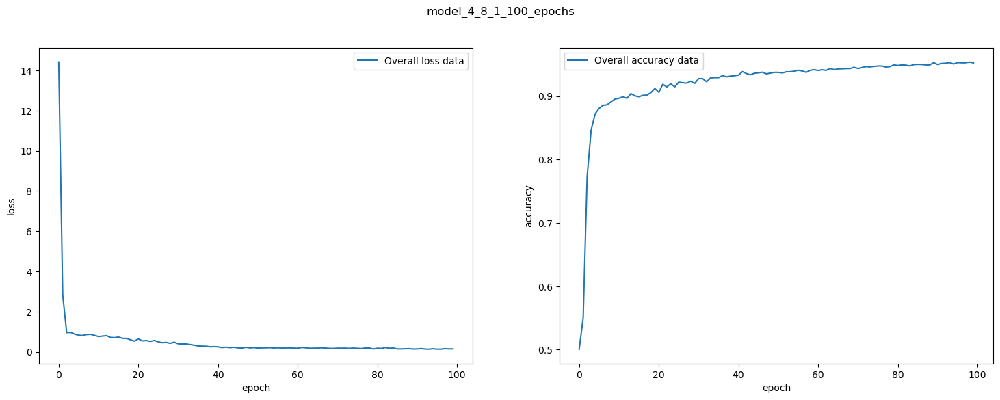

In [102]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_4_8_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 4, 8, and 1 neurons in each layer. It was trained for 100 epochs and achieved an accuracy of 0.9526, but overfitting was observed. Hence, it might be best to use 100 epochs as the optimal number for training the model. To improve the model's accuracy, we can increase the number of neurons and layers by modifying the model architecture.

<br></br>
#### Model Building with multiple layers and neurons (8-4-1) and 50 epochs

In [105]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(4, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [106]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 4s 1ms/step - loss: 30.5770 - accuracy: 0.4190
Epoch 2/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.7043 - accuracy: 0.6263
Epoch 3/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3660 - accuracy: 0.8542
Epoch 4/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2965 - accuracy: 0.8867
Epoch 5/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2581 - accuracy: 0.9046
Epoch 6/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2312 - accuracy: 0.9182
Epoch 7/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2149 - accuracy: 0.9244
Epoch 8/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2061 - accuracy: 0.9287
Epoch 9/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1948 - accuracy: 0.9314
Epoch 10/50
2798/2798 [==============================] - 3s 1ms/step - loss: 0.17

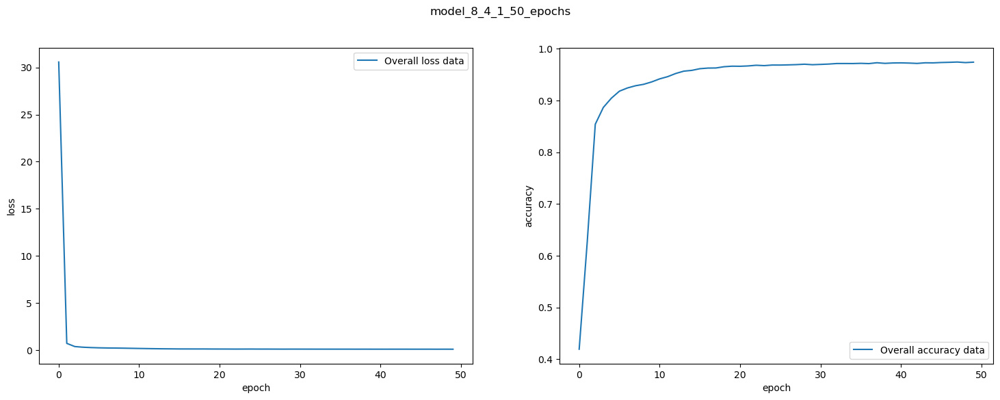

In [107]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_4_1_50_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 8, 4, and 1 neurons in each layer. After being trained for 50 epochs, the model achieved an accuracy of 0.9743, but it showed signs of overfitting or convergence problems slowly. As a result, it may be beneficial to increse the number of epochs for training the model.

<br></br>
#### Model Building with multiple layers and neurons (8-4-1) and 100 epochs

In [108]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(4, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [109]:
# Let's fit the sequential model with input features and output label
model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 11.7179 - accuracy: 0.6679
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3442 - accuracy: 0.8311
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2632 - accuracy: 0.9136
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2269 - accuracy: 0.9287
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2076 - accuracy: 0.9347
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1855 - accuracy: 0.9395
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1693 - accuracy: 0.9444
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1565 - accuracy: 0.9479
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1438 - accuracy: 0.9512
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - 

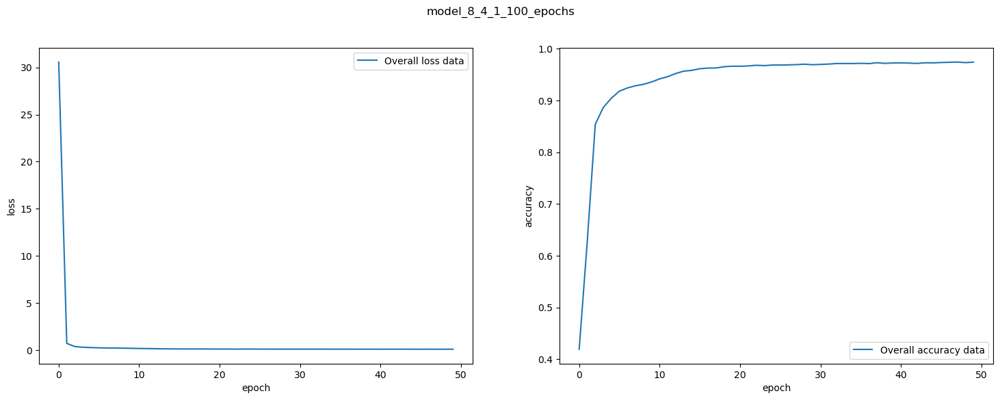

In [110]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_4_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 8, 4, and 1 neurons in each layer. It was trained for 100 epochs and achieved an accuracy of 0.9817, but overfitting was observed. Hence, it might be best to use 100 epochs as the optimal number for training the model. To improve the model's accuracy, we can increase the number of neurons and layers by modifying the model architecture.

<br></br>
#### Model Building with multiple layers and neurons (8-8-1) and 100 epochs

In [111]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [112]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 4.2223 - accuracy: 0.6786
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9583 - accuracy: 0.8266
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9333 - accuracy: 0.8376
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.7941 - accuracy: 0.8699
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6911 - accuracy: 0.8948
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6511 - accuracy: 0.8972
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6118 - accuracy: 0.8982
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4860 - accuracy: 0.9081
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3816 - accuracy: 0.9218
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - l

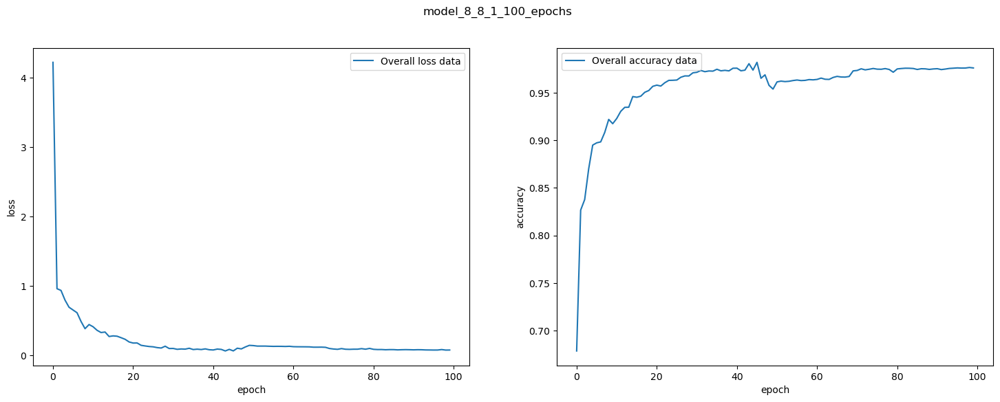

In [113]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_8_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 8, 8, and 1 neurons in each layer. It was trained for 100 epochs and achieved an accuracy of 0.9759, but overfitting was observed. Hence, it might be best to use 100 epochs as the optimal number for training the model. To improve the model's accuracy, we can increase the number of neurons and layers by modifying the model architecture.

<br></br>
#### Model Building with multiple layers and neurons (16-8-1) and 100 epochs

In [114]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(16, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [115]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 8.3714 - accuracy: 0.8786
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4498 - accuracy: 0.8856
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3891 - accuracy: 0.8949
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4083 - accuracy: 0.8950
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3585 - accuracy: 0.8978
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3355 - accuracy: 0.9003
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3096 - accuracy: 0.9037
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2795 - accuracy: 0.9094
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2607 - accuracy: 0.9100
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - l

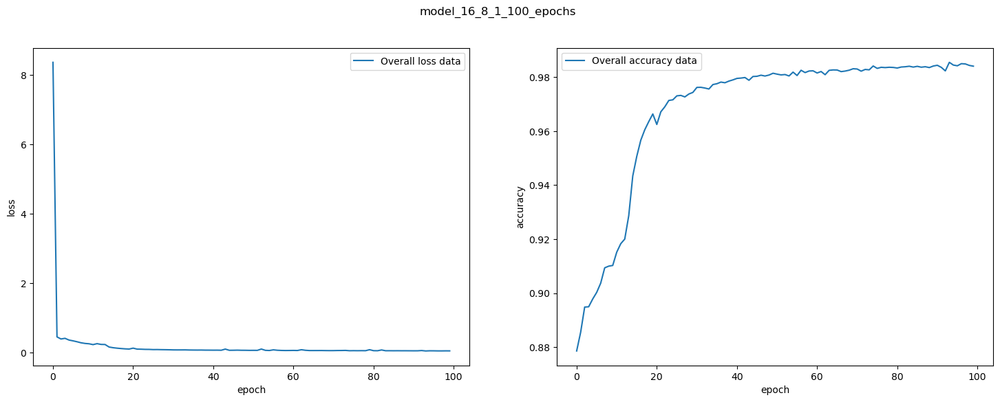

In [116]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_16_8_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 16, 8, and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9840, but it showed signs of overfitting or convergence problems. As a result, it may be beneficial to stick with 100 epochs and increse the network architecture to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (16-16-1) and 100 epochs

In [117]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(16, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [118]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=100, verbose=1)

Epoch 1/100
2798/2798 [==============================] - 4s 1ms/step - loss: 8.5639 - accuracy: 0.8242
Epoch 2/100
2798/2798 [==============================] - 3s 1ms/step - loss: 1.3367 - accuracy: 0.8769
Epoch 3/100
2798/2798 [==============================] - 3s 1ms/step - loss: 1.1700 - accuracy: 0.8885
Epoch 4/100
2798/2798 [==============================] - 3s 1ms/step - loss: 1.1793 - accuracy: 0.8953
Epoch 5/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9849 - accuracy: 0.8977
Epoch 6/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8381 - accuracy: 0.9010
Epoch 7/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.7666 - accuracy: 0.9032
Epoch 8/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6470 - accuracy: 0.9073
Epoch 9/100
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5237 - accuracy: 0.9130
Epoch 10/100
2798/2798 [==============================] - 3s 1ms/step - l

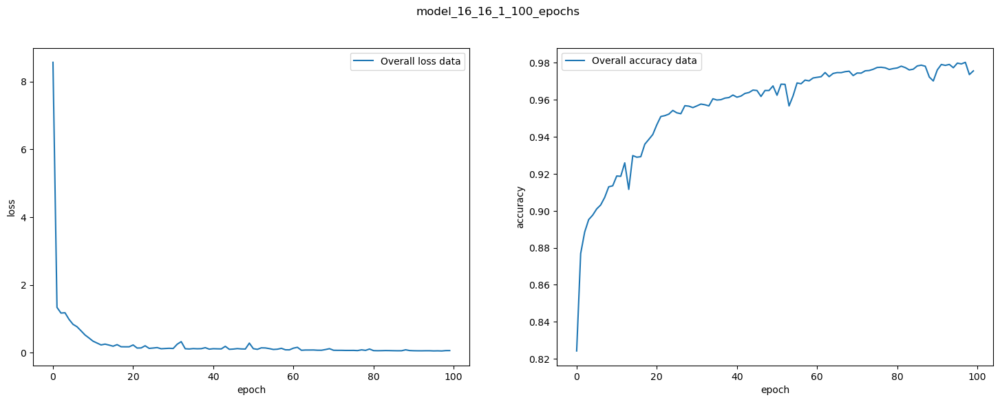

In [119]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_16_16_1_100_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 16, 16, and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9759, but it showed signs of overfitting or convergence problems. As a result, it may be beneficial to stick with 100 epochs and increse the network architecture to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (32-16-1) and 150 epochs

In [120]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(32, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [121]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 11.3058 - accuracy: 0.8476
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 4.2751 - accuracy: 0.8855
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 3.6229 - accuracy: 0.8959
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 3.2088 - accuracy: 0.9036
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.3634 - accuracy: 0.9072
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.2355 - accuracy: 0.9014
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.7302 - accuracy: 0.9098
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.3637 - accuracy: 0.9194
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9902 - accuracy: 0.9315
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - 

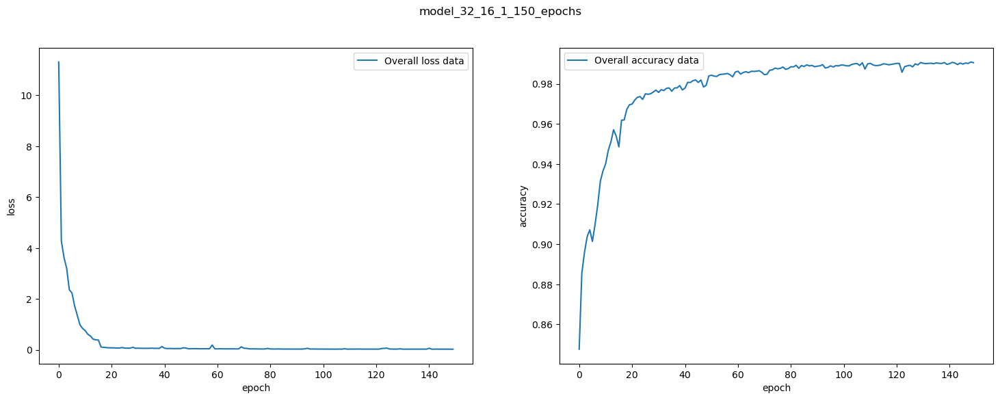

In [122]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_16_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 16, 16, and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9905, but it showed signs of overfitting or convergence problems. As a result, it may be beneficial to stick with 150 epochs and increse the network architecture to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (32-32-1) and 150 epochs

In [125]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(32, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(32, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [126]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 6.6292 - accuracy: 0.8412
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.7904 - accuracy: 0.8877
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.0039 - accuracy: 0.9092
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.3562 - accuracy: 0.9285
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.2621 - accuracy: 0.9308
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6961 - accuracy: 0.9469
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5869 - accuracy: 0.9508
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4978 - accuracy: 0.9570
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3711 - accuracy: 0.9570
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

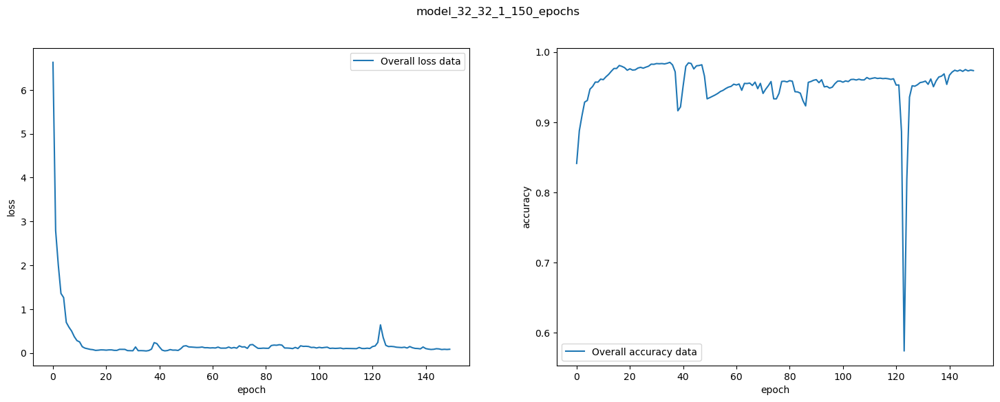

In [127]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_32_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has three layers with 32, 32, and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9734, but it showed signs of overfitting or convergence problems. As a result, it may be beneficial to stick with 150 epochs and increse the network architecture to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (128-128-1) and 150 epochs

In [128]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(128, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(128, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [129]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 5s 1ms/step - loss: 13.4671 - accuracy: 0.8437
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 5.3187 - accuracy: 0.8845
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.5273 - accuracy: 0.9013
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.0841 - accuracy: 0.9174
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.8285 - accuracy: 0.9282
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2499 - accuracy: 0.9448
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2451 - accuracy: 0.9567
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.0963 - accuracy: 0.9654
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.0855 - accuracy: 0.9697
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - 

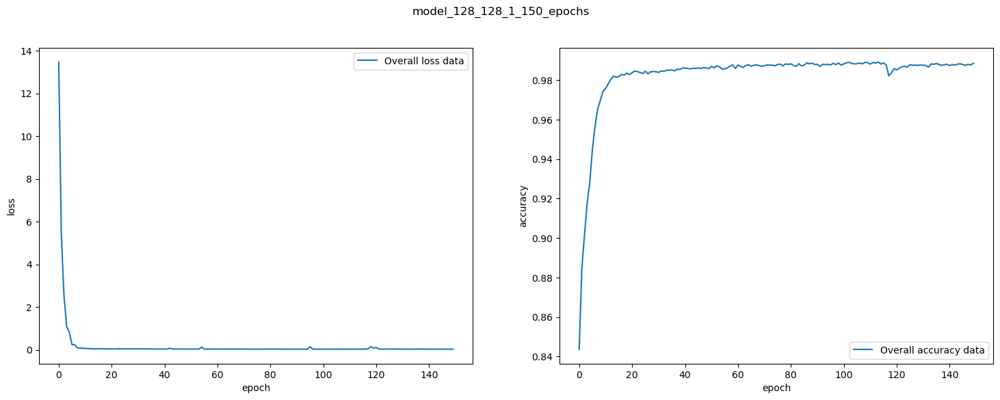

In [130]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_128_128_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 128, 128 and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9885, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 100 epochs.

<br></br>
#### Model Building with multiple layers and neurons (8-8-8-1) and 150 epochs

In [131]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(8, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [132]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 56.6353 - accuracy: 0.6884
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4000 - accuracy: 0.8627
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3008 - accuracy: 0.8946
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2896 - accuracy: 0.9052
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2513 - accuracy: 0.9139
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2302 - accuracy: 0.9143
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2267 - accuracy: 0.9162
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2209 - accuracy: 0.9177
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2170 - accuracy: 0.9189
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - 

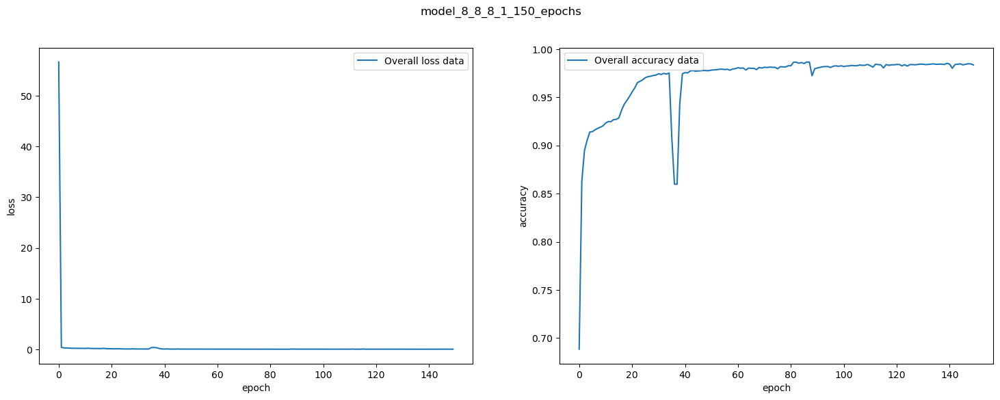

In [133]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_8_8_8_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 32, 16, 8 and 1 neurons in each layer. After being trained for 100 epochs, the model achieved an accuracy of 0.9835, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 100 epochs.

<br></br>
#### Model Building with multiple layers and neurons (16-8-16-1) and 150 epochs

In [134]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(16, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(8, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [135]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 2.5886 - accuracy: 0.8218
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.7275 - accuracy: 0.8649
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6186 - accuracy: 0.8883
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6615 - accuracy: 0.8907
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5693 - accuracy: 0.9004
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4500 - accuracy: 0.9132
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3474 - accuracy: 0.9257
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2489 - accuracy: 0.9377
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1765 - accuracy: 0.9501
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

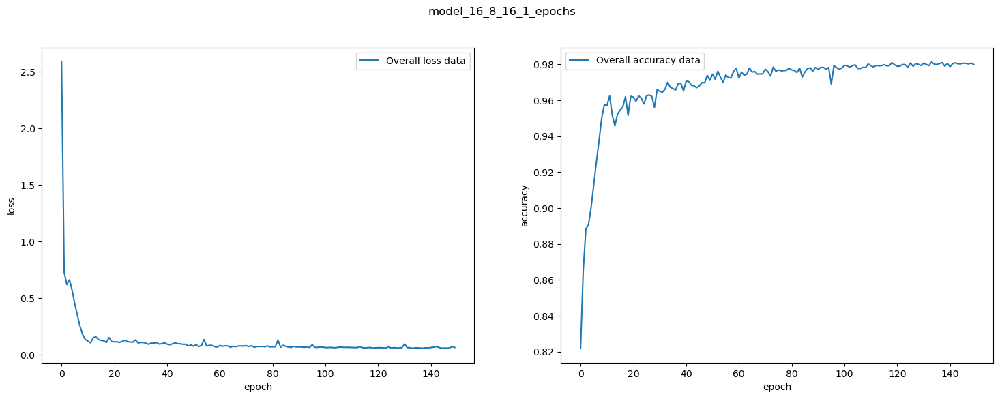

In [136]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_16_8_16_1_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 16, 8, 16 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9799, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons

<br></br>
#### Model Building with multiple layers and neurons (32-64-16-1) and 150 epochs

In [140]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(32, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(64, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [141]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 6.9746 - accuracy: 0.8281
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 3.3738 - accuracy: 0.8790
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.9047 - accuracy: 0.9007
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.2352 - accuracy: 0.9095
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.6429 - accuracy: 0.9229
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4353 - accuracy: 0.9295
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2790 - accuracy: 0.9375
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1857 - accuracy: 0.9449
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1411 - accuracy: 0.9515
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

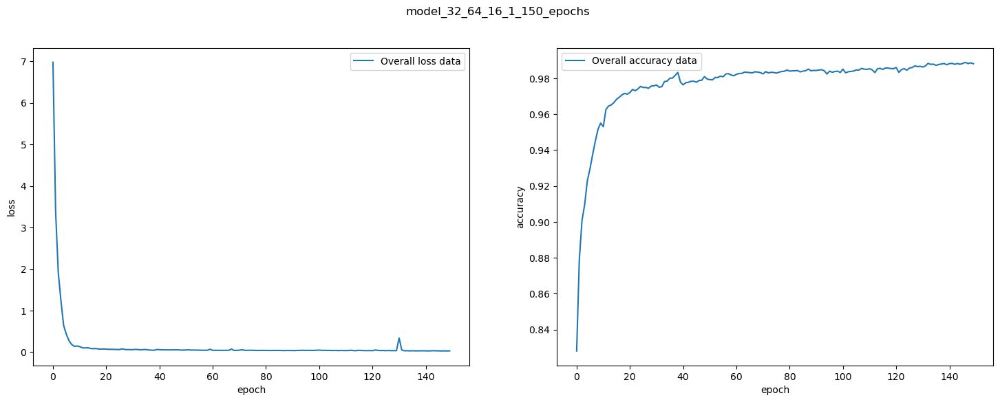

In [142]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_64_16_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 32, 64, 16 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9881, it showed signs of overfitting or convergence. As a result, it may be beneficial to decrease the number of epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy

<br></br>
#### Model Building with multiple layers and neurons (64-32-16-1) and 150 epochs

In [143]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(64, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [144]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 8.3898 - accuracy: 0.8534
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.2237 - accuracy: 0.8921
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 1.0122 - accuracy: 0.9037
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2735 - accuracy: 0.9100
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2444 - accuracy: 0.9061
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2401 - accuracy: 0.9184
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1902 - accuracy: 0.9323
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2376 - accuracy: 0.9304
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1615 - accuracy: 0.9401
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

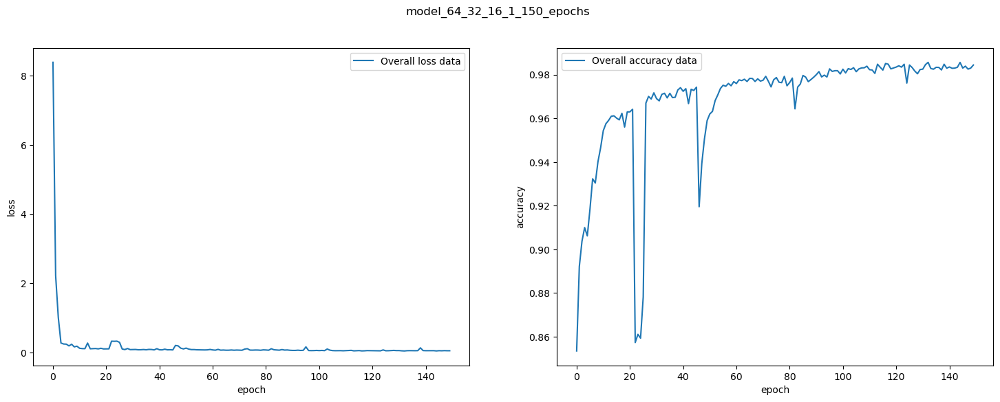

In [145]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_64_32_16_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 64, 32, 16 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9844, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (128-64-64-1) and 150 epochs

In [148]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(128, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [149]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 4.6028 - accuracy: 0.8396
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5966 - accuracy: 0.8889
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2946 - accuracy: 0.8983
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2762 - accuracy: 0.8996
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2464 - accuracy: 0.9156
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3112 - accuracy: 0.8846
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2563 - accuracy: 0.9142
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4542 - accuracy: 0.9061
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5192 - accuracy: 0.6830
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

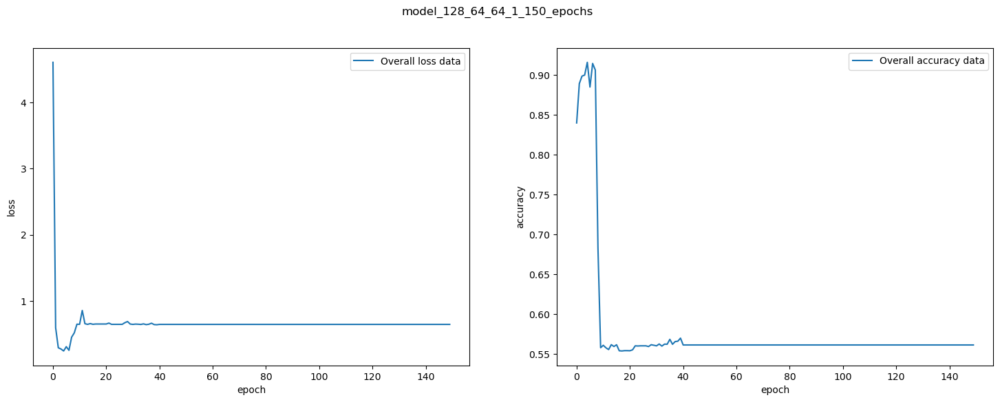

In [150]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_128_64_64_1_150_epochs", model=model, model_history=history)

### Observations
The accuracy of the model increases rapidly during the initial training phase with larger increments, but after 9 epochs, it decreases significantly. This may be due to the unbalanced number of neurons in the layers. Specifically, the first layer has a large number of neurons, while the second and third layers have relatively fewer neurons. To improve the model's performance, one approach is to increase the number of neurons in the third layer or decrease the number of neurons in the first layer.

<br></br>
#### Model Building with multiple layers and neurons (128-128-64-1) and 150 epochs

In [157]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(128, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [158]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 10.3918 - accuracy: 0.8388
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 2.8516 - accuracy: 0.8853
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9283 - accuracy: 0.9006
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2398 - accuracy: 0.9238
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2639 - accuracy: 0.9057
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.3715 - accuracy: 0.8338
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.5120 - accuracy: 0.9220
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2062 - accuracy: 0.9261
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1977 - accuracy: 0.9276
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - 

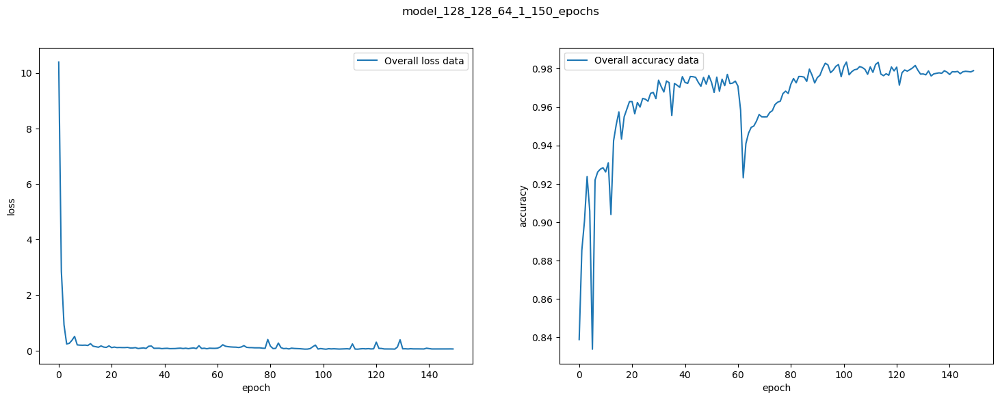

In [159]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_128_128_64_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 128, 128, 64 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9790, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (16-32-32-16-1) and 150 epochs

In [160]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(16, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(32, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [161]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 2.8241 - accuracy: 0.8362
Epoch 2/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.9021 - accuracy: 0.8768
Epoch 3/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.4592 - accuracy: 0.8905
Epoch 4/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2601 - accuracy: 0.9107
Epoch 5/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2349 - accuracy: 0.9186
Epoch 6/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2241 - accuracy: 0.9250
Epoch 7/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2119 - accuracy: 0.9184
Epoch 8/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.2357 - accuracy: 0.9195
Epoch 9/150
2798/2798 [==============================] - 3s 1ms/step - loss: 0.1849 - accuracy: 0.9242
Epoch 10/150
2798/2798 [==============================] - 3s 1ms/step - l

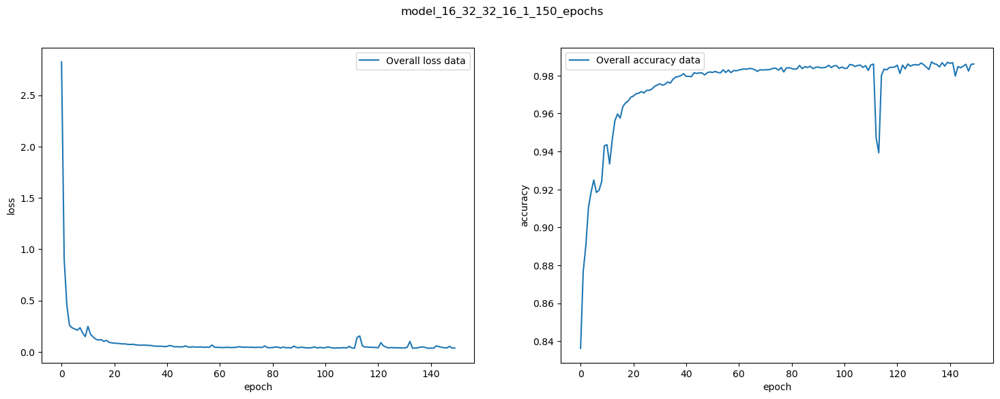

In [162]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_16_32_32_16_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 16, 32, 32, 16 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9861, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (32-128-64-32-1) and 150 epochs

In [163]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(32, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [164]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 4s 1ms/step - loss: 6.9395 - accuracy: 0.8279
Epoch 2/150
2798/2798 [==============================] - 4s 1ms/step - loss: 1.0918 - accuracy: 0.8838
Epoch 3/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.4418 - accuracy: 0.9052
Epoch 4/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.2168 - accuracy: 0.9179
Epoch 5/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.2026 - accuracy: 0.9230
Epoch 6/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1700 - accuracy: 0.9354
Epoch 7/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1865 - accuracy: 0.9452
Epoch 8/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1980 - accuracy: 0.9430
Epoch 9/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1246 - accuracy: 0.9550
Epoch 10/150
2798/2798 [==============================] - 4s 1ms/step - l

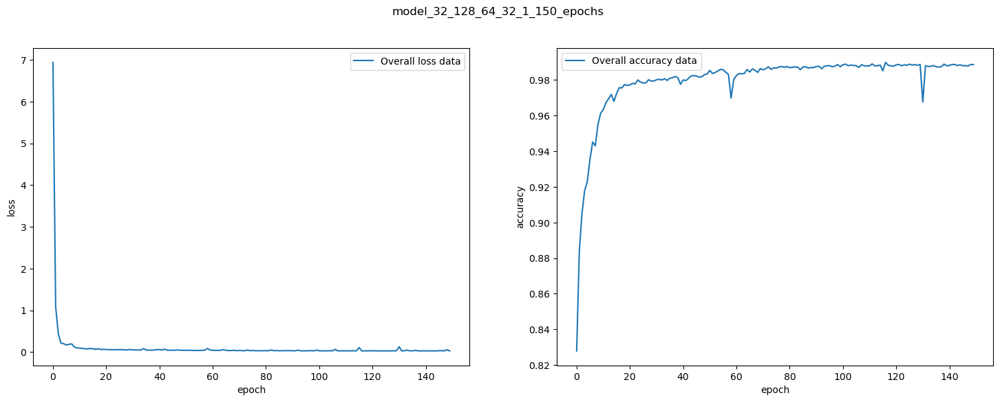

In [165]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_128_64_32_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 32, 128, 64, 32 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9886, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy.

<br></br>
#### Model Building with multiple layers and neurons (32-128-128-64-32-1) and 150 epochs

In [166]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(32, activation="relu", input_dim=data_frame.shape[1] - 1))
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(1, activation="sigmoid"))


# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [167]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=X_smote, y=y_smote, epochs=150, verbose=1)

Epoch 1/150
2798/2798 [==============================] - 5s 1ms/step - loss: 5.1992 - accuracy: 0.8255
Epoch 2/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.4606 - accuracy: 0.8828
Epoch 3/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.2612 - accuracy: 0.8974
Epoch 4/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.2377 - accuracy: 0.9104
Epoch 5/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1862 - accuracy: 0.9295
Epoch 6/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.2359 - accuracy: 0.9304
Epoch 7/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1471 - accuracy: 0.9428
Epoch 8/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1299 - accuracy: 0.9494
Epoch 9/150
2798/2798 [==============================] - 4s 1ms/step - loss: 0.1092 - accuracy: 0.9567
Epoch 10/150
2798/2798 [==============================] - 4s 1ms/step - l

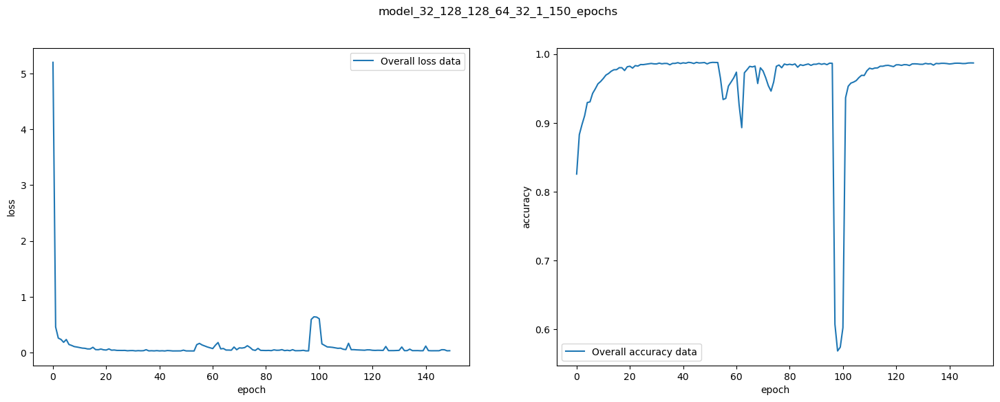

In [168]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_128_128_64_32_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 32, 128, 128, 64, 32 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9870, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs and incerase the network complexity by adding more layers/neurons to achieve 100 percent accuracy.

<br></br>
### Overfitting - 100 percent accuracy
#### Model Building with multiple layers and neurons (128-128-128-128-128-1) and 50 epochs

In [186]:
# Let's create a keras sequential model
model = Sequential()

# Let's add dense layers to the sequential model network

model.add(Dense(128, activation="relu", input_dim=data_frame.shape[1]))
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [187]:
# Let's fit the sequential model with input features and output label
history = model.fit(x=np.hstack([X_smote, y_smote.reshape(-1, 1)]), y=y_smote, epochs=50, verbose=1)

Epoch 1/50
2798/2798 [==============================] - 5s 2ms/step - loss: 1.9769 - accuracy: 0.8468
Epoch 2/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.2933 - accuracy: 0.8964
Epoch 3/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.2137 - accuracy: 0.9192
Epoch 4/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.2357 - accuracy: 0.9366
Epoch 5/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.1219 - accuracy: 0.9556
Epoch 6/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.0798 - accuracy: 0.9722
Epoch 7/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.0784 - accuracy: 0.9764
Epoch 8/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.0562 - accuracy: 0.9814
Epoch 9/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.0605 - accuracy: 0.9810
Epoch 10/50
2798/2798 [==============================] - 4s 2ms/step - loss: 0.044

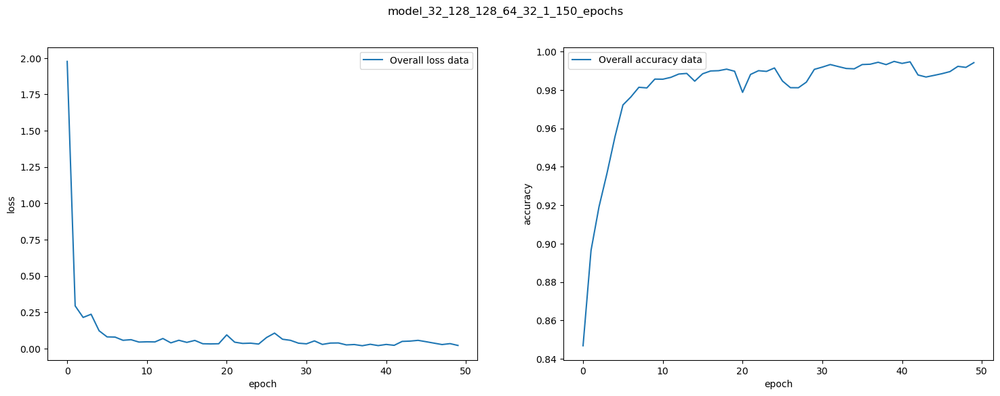

In [188]:
# Let's plot the loss and accuracy using model history on the entire dataset
plot_loss_accuracy(model_name="model_32_128_128_64_32_1_150_epochs", model=model, model_history=history)

### Observations
The current neural network has four layers with 32, 128, 64, 32 and 1 neurons in each layer. After being trained for 150 epochs, the model achieved an accuracy of 0.9942, it showed signs of overfitting or convergence. As a result, it may be beneficial to stick with 150 epochs.

<br></br>
## Phase - 3 Model selection & evaluation

<br></br>
### Data Shuffling

In [189]:
# Let's create a dataframe of oversampling values
oversampled_df = pd.concat([pd.DataFrame(X_smote), pd.DataFrame(y_smote)], axis=1)

# Let's shuffle the oversampled dataframe
oversampled_df = oversampled_df.sample(frac=1).reset_index(drop=True)

X_smote = oversampled_df.iloc[:, :-1].values
y_smote = oversampled_df.iloc[:, -1].values

### Dividing data into train and validation subsets

In [190]:
def train_test_split(train_ratio):
    # Let's find the total number of unique output labels in the dataset
    unique_labels = list(set(y_smote))
    num_labels = len(unique_labels)

    # Let's create a dictionary to store the indices of each label in the dataset
    label_indices = {}
    for i in range(len(y_smote)):
        label = y_smote[i]
        if label not in label_indices:
            label_indices[label] = []
        label_indices[label].append(i)

    # Let's shuffle the indices of each label in the dictionary
    for label in unique_labels:
        random.shuffle(label_indices[label])

    # Let's calculate the number of samples needed for each label 
    # to have an equal distribution in both train and test sets

    samples_per_label = len(X_smote) // len(unique_labels)
    train_samples_per_label = int(samples_per_label * train_ratio)
    validation_samples_per_label = samples_per_label - train_samples_per_label

    # Let's initialize empty lists to store the indices of samples in the train and test sets
    train_indices = []
    test_indices = []

    # Let's iterate through the shuffled indices of each label and 
    # allocate the appropriate number of samples for each label to the train 
    # and test sets while maintaining stratification
    for label in unique_labels:
        label_indices_list = label_indices[label]
        for i in range(len(label_indices_list)):
            if i < train_samples_per_label:
                train_indices.append(label_indices_list[i])
            else:
                test_indices.append(label_indices_list[i])
        if len(train_indices) == train_samples_per_label * len(unique_labels):
            break

    # Let's concatenate the input and output data for each set 
    # using the allocated indices to create two datasets with stratification
    train_inputs = np.array([X_smote[i] for i in train_indices])
    train_outputs = np.array([y_smote[i] for i in train_indices])

    test_inputs = np.array([X_smote[i] for i in test_indices])
    test_outputs = np.array([y_smote[i] for i in test_indices])

    return train_inputs, train_outputs, test_inputs, test_outputs

In [191]:
# Let's initialize the train_ratio value
train_ratio = 0.8

# Let's call the train_test_split function to split the data into train and validation datasets
train_inputs, train_outputs, test_inputs, test_outputs = train_test_split(train_ratio=train_ratio)

<br></br>
### Model Building 
1. one layer and one neuron (1-1)
2. Two layers with 8 and 1 neurons respectively(8-1)
3. Three layers with 4, 4 and 1 neurons respectively(4-4-1)
4. Three layers with 16, 8 and 1 neurons respectively(16-8-1)
5. Three layers with 32, 16 and 1 neurons respectively(32-16-1)
6. Four layers with 128, 128, 64 and 1 neurons respectively(128-128-64-1)
7. Five layers with 16, 32, 32, 16 and 1 neurons respectively(16-32-32-16-1)
8. Five layers with 32, 128, 64, 32 and 1 neurons respectively(32-128-64-32-1)

In [192]:
# Let's craete a model with one layer and one neuron
model_base = Sequential()
model_base.add(Dense(1, input_dim=data_frame.shape[1] - 1, activation="sigmoid"))

In [193]:
# Let's create a model with two layers,consisting
# of 8 and 1 neurons, respectively

model_8_1 = Sequential()
model_8_1.add(Dense(8, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_8_1.add(Dense(1, activation="sigmoid"))

In [194]:
# Let's create a model with three layers,consisting
# of 4, 4 and 1 neurons, respectively

model_4_4_1 = Sequential()
model_4_4_1.add(Dense(4, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_4_4_1.add(Dense(4, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_4_4_1.add(Dense(1, activation="sigmoid"))

In [195]:
# Let's create a model with three layers,consisting
# of 16, 8 and 1 neurons, respectively

model_16_8_1 = Sequential()
model_16_8_1.add(Dense(16, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_8_1.add(Dense(8, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_8_1.add(Dense(1, activation="sigmoid"))

In [196]:
# Let's create a model with three layers,consisting
# of 32, 16 and 1 neurons, respectively

model_32_16_1 = Sequential()
model_32_16_1.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_16_1.add(Dense(16, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_16_1.add(Dense(1, activation="sigmoid"))

In [197]:
# Let's create a model with three layers,consisting
# of 128, 128, 64 and 1 neurons, respectively

model_128_128_64_1 = Sequential()
model_128_128_64_1.add(Dense(128, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_128_128_64_1.add(Dense(128, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_128_128_64_1.add(Dense(64, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_128_128_64_1.add(Dense(1, activation="sigmoid"))

In [198]:
# Let's create a model with three layers,consisting
# of 16, 32, 32, 16 and 1 neurons, respectively

model_16_32_32_16_1 = Sequential()
model_16_32_32_16_1.add(Dense(16, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_32_32_16_1.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_32_32_16_1.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_32_32_16_1.add(Dense(16, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_16_32_32_16_1.add(Dense(1, activation="sigmoid"))

In [199]:
# Let's create a model with three layers,consisting
# of 32, 128, 64, 32 and 1 neurons, respectively

model_32_128_64_32_1 = Sequential()
model_32_128_64_32_1.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_128_64_32_1.add(Dense(128, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_128_64_32_1.add(Dense(64, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_128_64_32_1.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_32_128_64_32_1.add(Dense(1, activation="sigmoid"))

In [200]:
# Let's initialize a list which has all the model names corresponding to adam optimizer
adam_model_names = [
    "model_base",
    "model_8_1", 
    "model_4_4_1", 
    "model_16_8_1", 
    "model_32_16_1", 
    "model_128_128_64_1",
    "model_16_32_32_16_1",
    "model_32_128_64_32_1"
]

# Let's initialize a list to store all the compiled models during training and evaluation
adam_models = []

# Let's build the model using binary_crossentropy as the loss function 
# and accuracy as the evaluation metric during the compilation process
model_base.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_8_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_4_4_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_16_8_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_32_16_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_128_128_64_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_16_32_32_16_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model_32_128_64_32_1.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

# Let's append the model_objects into a list
for model_name in adam_model_names:
    adam_models.append(globals()[model_name])

In [201]:
# Let's initialize a list to store all the model histories during training and evaluation
adam_history = []

for index, model_name in enumerate(adam_model_names):
    print()
    print(f"Let's fit the sequential model --> {model_name}")
    # print()
    callback_file = f"models/adam_{model_name}.hdf5"
    callback_a = ModelCheckpoint(filepath = callback_file, monitor="val_loss", save_best_only = True, save_weights_only = True, verbose = 0)
    callback_b = EarlyStopping(monitor="val_loss", mode="min", patience=20, verbose=0)
    history = adam_models[index].fit(x=train_inputs, y=train_outputs, validation_data=(test_inputs, test_outputs), epochs = 100, batch_size=128, callbacks = [callback_a, callback_b], verbose = 1)
    adam_history.append(history)


Let's fit the sequential model --> model_base
Epoch 1/100
560/560 [==============================] - 1s 1ms/step - loss: 115.1353 - accuracy: 0.2126 - val_loss: 34.9231 - val_accuracy: 0.1891
Epoch 2/100
560/560 [==============================] - 1s 1ms/step - loss: 18.1631 - accuracy: 0.2462 - val_loss: 9.2389 - val_accuracy: 0.2576
Epoch 3/100
560/560 [==============================] - 1s 1ms/step - loss: 4.8010 - accuracy: 0.3860 - val_loss: 1.6328 - val_accuracy: 0.6013
Epoch 4/100
560/560 [==============================] - 1s 1ms/step - loss: 1.1116 - accuracy: 0.6815 - val_loss: 1.0140 - val_accuracy: 0.7274
Epoch 5/100
560/560 [==============================] - 1s 1ms/step - loss: 0.8715 - accuracy: 0.7695 - val_loss: 0.6828 - val_accuracy: 0.8080
Epoch 6/100
560/560 [==============================] - 1s 1ms/step - loss: 0.7638 - accuracy: 0.7873 - val_loss: 1.2743 - val_accuracy: 0.7924
Epoch 7/100
560/560 [==============================] - 1s 1ms/step - loss: 0.9047 - accurac

In [202]:
from sklearn import metrics

# Function which evaluates on X_valid and y_valid and compares 
# the results with model checkpoint generated results


def model_evaluation(X_validation, y_validation, model, callback_file):
    # Let's get the loss and accuracy corresponding to particular model
    scores = model.evaluate(X_validation, y_validation, verbose=0)
    print(f"{model.metrics_names[0]}: {scores[0]}")
    print(f"{model.metrics_names[1]}: {scores[1]*100}")

    # Let's load the checkpoint and validate the metrics with above evaluated results
    model.load_weights(callback_file)
    prediction = model.predict(X_validation)
    prediction = (prediction > 0.5)
    confusion_matrix = metrics.confusion_matrix(y_validation, prediction)
    accuracy = (confusion_matrix[0, 0] + confusion_matrix[1, 1]) / sum(confusion_matrix.flatten()) * 100
    print(f"\n Confusion matrix with model evaluate \n{confusion_matrix}")
    print(f"Accuracy score with model evaluate: {accuracy}\n")

    accuracy = metrics.accuracy_score(y_validation, prediction.round()) * 100.0
    precision = metrics.precision_score(y_validation, prediction.round()) * 100.0
    recall = metrics.recall_score(y_validation, prediction.round()) * 100.0
    f1_score = metrics.f1_score(y_validation, prediction.round())

    print(f"Accuracy with model checkpoint: {accuracy}")
    print(f"Precision with model checkpoint: {precision}")
    print(f"Recall with model checkpoint: {recall}")
    print(f"F1-score with model checkpoint: {f1_score}")

    for i in range(5):
        print()
        print(f"Prediction={prediction[i]}")
    return prediction

In [203]:
# Let's initialize a list to store all the predictions corresponding to all the model architectures
adam_predictions = []

for index, (model_name, model) in enumerate(zip(adam_model_names, adam_models)):
    callback_file = f"models/adam_{model_name}.hdf5"
    print(f"===================================== {model_name} ===========================================")
    prediction = model_evaluation(test_inputs, test_outputs, model, callback_file)
    adam_predictions.append(prediction)
    print()

===================================== model_base ===========================================
loss: 0.916689932346344
accuracy: 82.14365243911743
560/560 [==============================] - 0s 650us/step

 Confusion matrix with model evaluate 
[[7731 1221]
 [ 961 7991]]
Accuracy score with model evaluate: 87.81277926720286

Accuracy with model checkpoint: 87.81277926720286
Precision with model checkpoint: 86.7455492835432
Recall with model checkpoint: 89.26496872207328
F1-score with model checkpoint: 0.8798722748293326

Prediction=[False]

Prediction=[False]

Prediction=[False]

Prediction=[False]

Prediction=[False]

===================================== model_8_1 ===========================================
loss: 0.41907256841659546
accuracy: 94.10746097564697
560/560 [==============================] - 0s 716us/step

 Confusion matrix with model evaluate 
[[8351  601]
 [ 708 8244]]
Accuracy score with model evaluate: 92.68878462913315

Accuracy with model checkpoint: 92.68878462913315
P

In [204]:
# Function to plot the validation loss and validation accuracy
def classification_plots(model_name, model_history):
    # Let's create plot with multiple subplots(2 for each row)
    figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    figure.suptitle(model_name)
    ax1.plot(model_history.history["loss"])
    ax1.plot(model_history.history["val_loss"])
    ax1.set_ylabel("loss")
    ax1.set_xlabel("epoch")
    ax1.legend(["Training loss data", "validation loss data"], loc="best")

    ax2.plot(model_history.history["accuracy"])
    ax2.plot(model_history.history["val_accuracy"])
    ax2.set_ylabel("accuracy")
    ax2.set_xlabel("epoch")
    ax2.legend(["Training accuracy data", "validation accuracy data"], loc="best")
    figure.show()

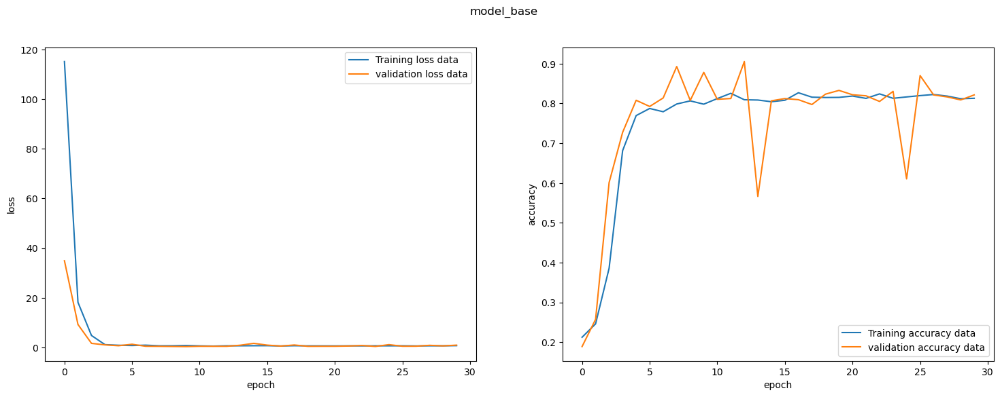

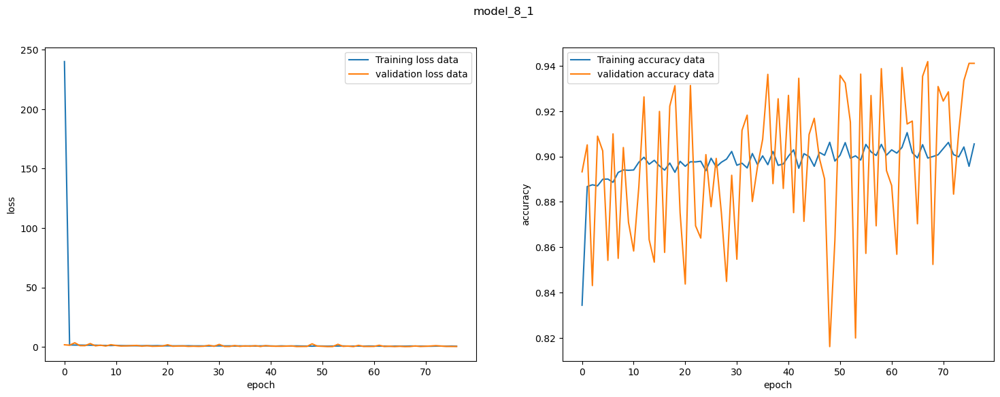

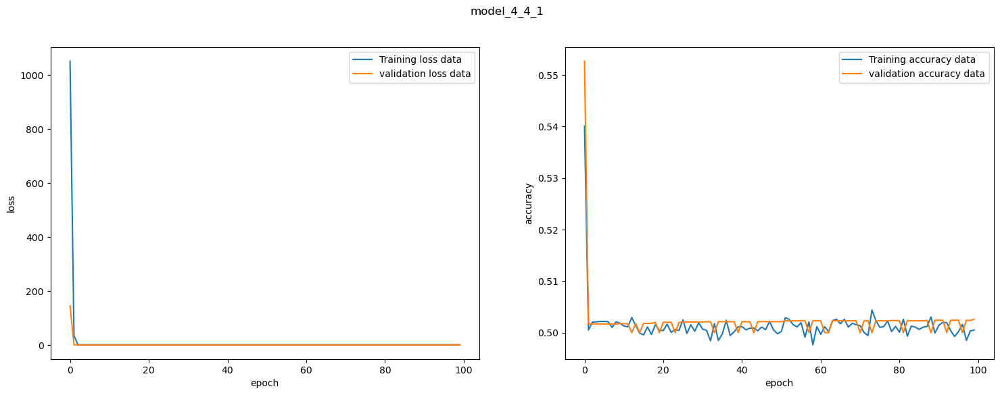

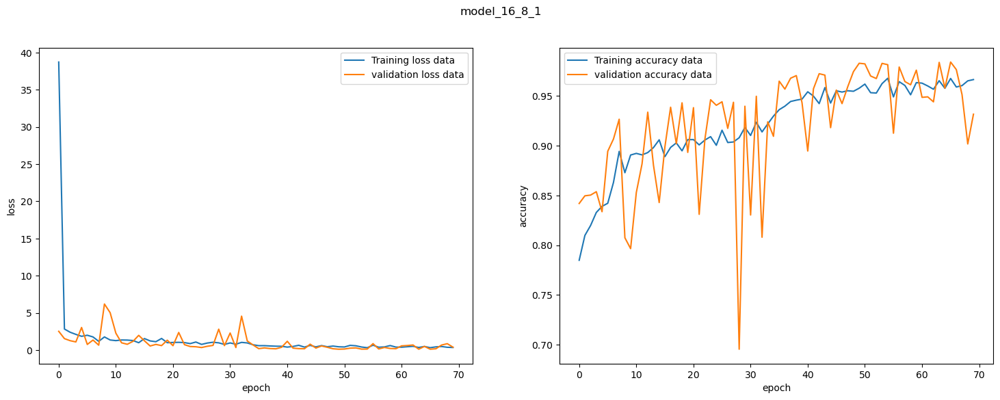

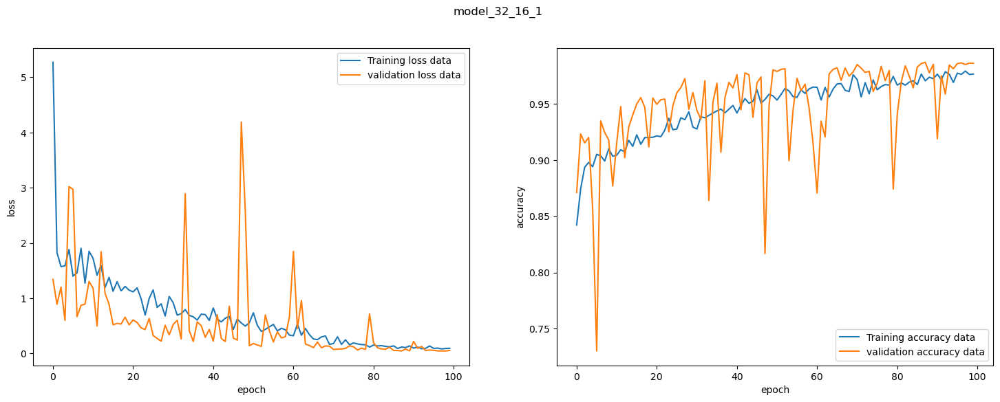

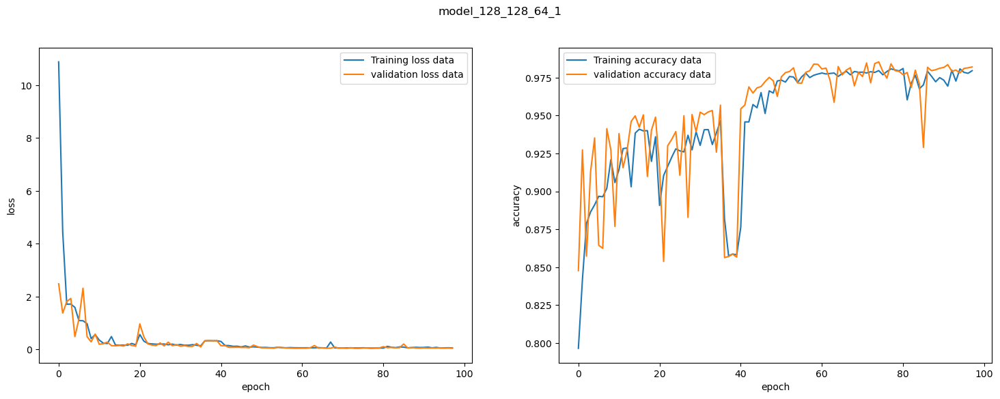

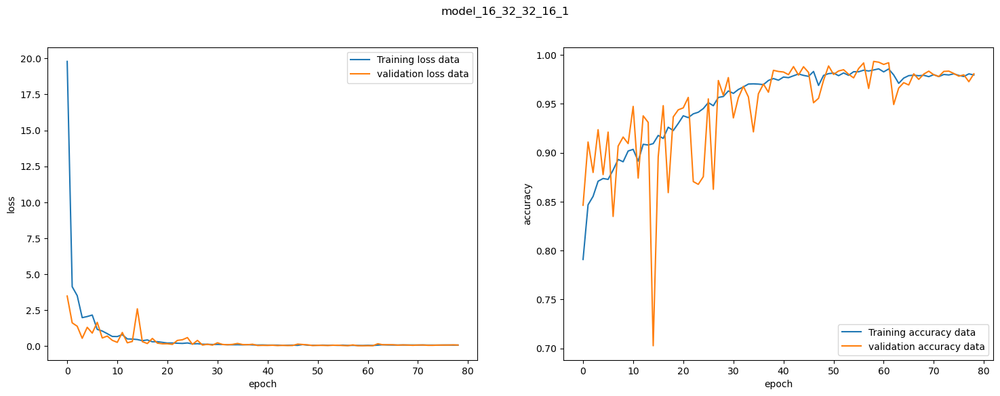

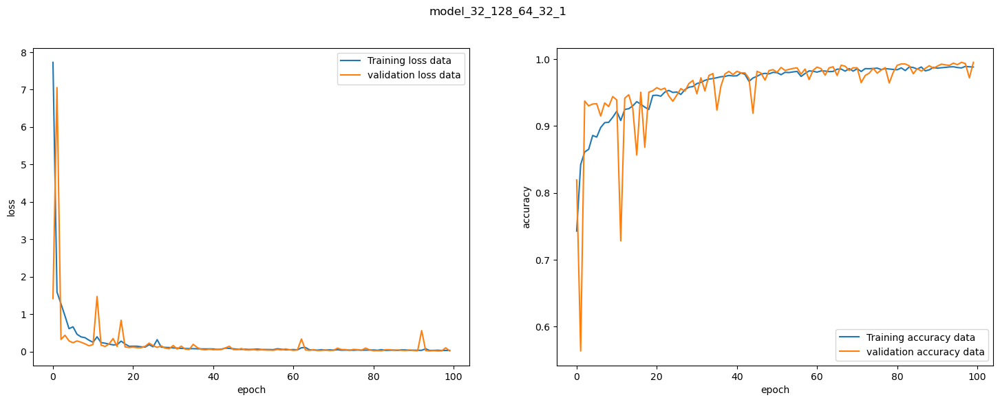

In [205]:
# Let's iterate over the model names to plot the loss and accuracy
for index, (model_name, model_history) in enumerate(zip(adam_model_names, adam_history)):
    # Let's call the classification_plots 
    classification_plots(model_name=model_name, model_history=model_history)

<br></br>
**What are ROC curves?** The ROC curve is a graphical representation of the performance of a binary classifier system as the discrimination threshold is varied. It plots the true positive rate against the false positive rate. The area under the curve (AUC) is a performance metric for binary classification problems. The higher the AUC, the better the model is at distinguishing between positive and negative classes.

In [206]:
# Function to plot the ROC curves
def roc_auc_curve(y_validation, y_hypothesis, name="ROC Curve"):
    fpr, tpr, thresholds = metrics.roc_curve(y_validation, y_hypothesis)
    figure, ax = plt.subplots(figsize=(5, 3))
    figure.suptitle(name)
    ax.plot([0, 1], [0, 1], linestyle="dashed", color="b")
    ax.plot(fpr, tpr, color="red", label=("Area under the curve: ", round(metrics.auc(fpr, tpr), 4)))
    ax.set_xlabel("False Positive Rate", fontsize=10)
    ax.set_ylabel("True Positive Rate", fontsize=10)
    ax.legend(loc="best", fontsize=10)
    figure.show()

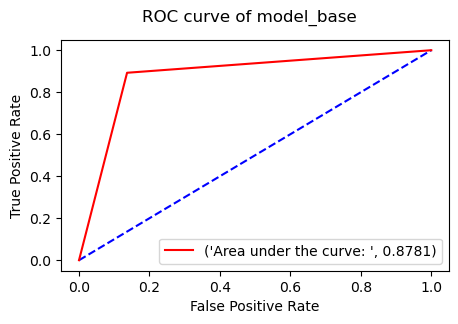

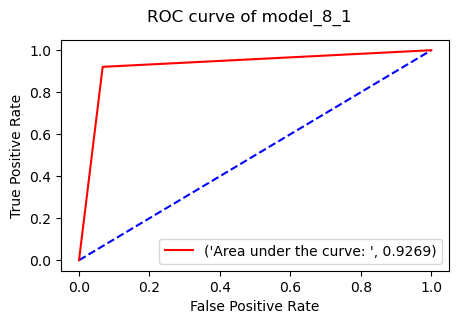

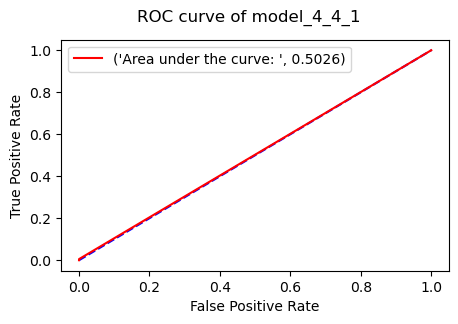

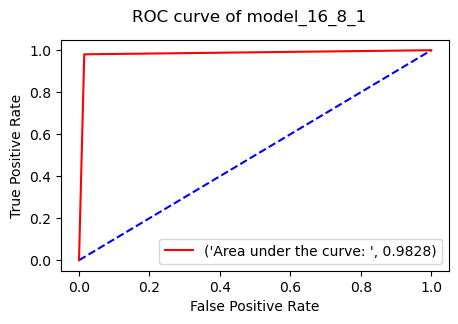

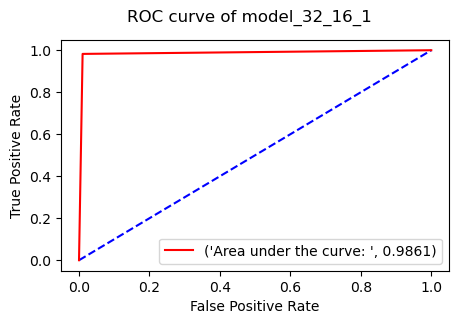

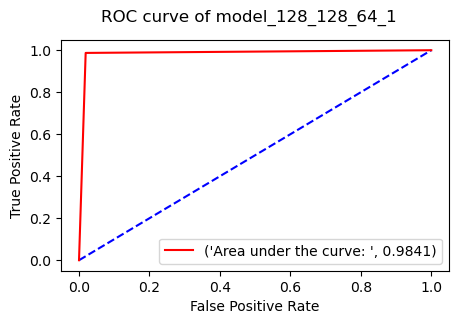

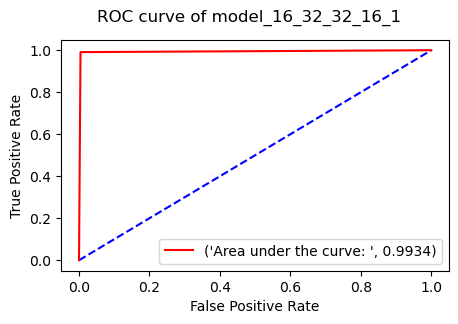

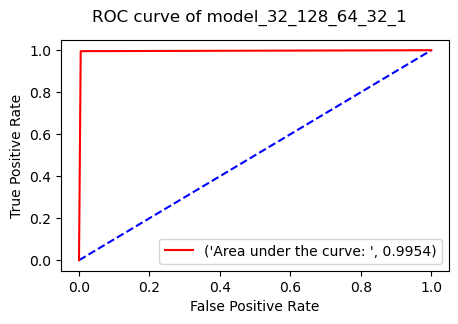

In [207]:
for (model_name, y_hypothesis) in zip(adam_model_names, adam_predictions):
    roc_auc_curve(
        y_validation=test_outputs,
        y_hypothesis=y_hypothesis,
        name=f"ROC curve of {model_name}"
    )

#### Verification of predictions using custom prediction function

In [208]:
# Activation functions
# Rectified Linear function
def rectified(x):
    return np.maximum(0, x)


# Sigmoid function
def sigmoid(x):
    return 1 / (1 + np.exp(np.negative(x)))


In [244]:
# Custom predict function to validate the predictions

def custom_predict(display_summary=True, display_weight=True):
    prediction = test_inputs
    total_layers = len(model_32_128_64_32_1.layers)

    if display_summary is not None:
        print(model_32_128_64_32_1.summary())

    for layer_number, layer in enumerate(model_32_128_64_32_1.layers):
        weights = layer.get_weights()[0].T
        biases = layer.get_weights()[1].T

        if display_weight:
            print(f"Layer Number --> {layer_number}")
            print(f"Weights:\n {weights[0]} ...")
            print(f"Bias:\n {biases[:5]}\n")

        holder = []
        for row in prediction:
            value = []
            for i, w in enumerate(weights):
                val = np.dot(w, row) + biases[i]
                value.append(val)

            if layer_number < total_layers - 1:
                holder.append(rectified(value))
            else:
                holder.append(sigmoid(value))

        prediction = np.array(holder)
    prediction = (prediction > 0.5)

    accuracy = metrics.accuracy_score(test_outputs, prediction.round()) * 100.0
    precision = metrics.precision_score(test_outputs, prediction.round()) * 100.0
    recall = metrics.recall_score(test_outputs, prediction.round()) * 100.0
    f1score = metrics.f1_score(test_outputs, prediction.round())

    print("Accuracy: %.2f%%" % (accuracy))
    print("Precision: %.2f%%" % (precision))
    print("Recall: %.2f%%" % (recall))
    print("F1-score: %.2f\n" % (f1score))

    for i in range(10):
        print(f"X={test_inputs[i][:5]}...., Predicted={prediction[i]}")
    return prediction

In [246]:
# Let's call the custom predict function and validate the results
predictions = custom_predict()

Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_229 (Dense)           (None, 32)                416       
                                                                 
 dense_230 (Dense)           (None, 128)               4224      
                                                                 
 dense_231 (Dense)           (None, 64)                8256      
                                                                 
 dense_232 (Dense)           (None, 32)                2080      
                                                                 
 dense_233 (Dense)           (None, 1)                 33        
                                                                 
Total params: 15,009
Trainable params: 15,009
Non-trainable params: 0
_________________________________________________________________
None
Layer Number --> 0
Weights:
 [-0.12409662  0

overflow encountered in exp


Accuracy: 99.54%
Precision: 99.52%
Recall: 99.55%
F1-score: 1.00

X=[   25.45    44.79     0.     400.   13222.  ]...., Predicted=[False]
X=[8.56397163e+00 1.61402080e+01 6.59003365e+02 4.00000000e+02
 1.37349954e+04]...., Predicted=[False]
X=[   27.87959485    45.0549372     71.90914055   400.
 12795.8182811 ]...., Predicted=[False]
X=[   45.46493366    16.37478966   822.85417847   400.
 13684.12507079]...., Predicted=[False]
X=[   26.23076881    47.45418451   190.23558482   437.49038988
 12765.50961012]...., Predicted=[False]
X=[-5.51026564e+00  4.36164182e+01  7.57986975e+01  4.00000000e+02
  1.27945974e+04]...., Predicted=[False]
X=[   26.20646499    46.96943577   120.3535012    413.70564234
 12777.82392943]...., Predicted=[False]
X=[   26.78712919    39.34513637    31.05585859   400.
 12840.        ]...., Predicted=[False]
X=[   23.84046775    49.7929367     49.05438472   400.
 13122.97280764]...., Predicted=[False]
X=[1.1747e+01 5.0610e+01 1.6700e+02 4.0000e+02 1.3145e+04]...., P

<br></br>
## Phase - 4 Feature importance and reduction

In [247]:
# Function to calculate the importance of each feature 
# and sorts them accordingly to find out the best fit features

def feature_importance():
    # Let's initialize the list to store the feature wise accuracy
    feature_accuracy = {}

    for index in range(train_inputs.shape[1]):
        # Let's get the values corresponding to the each feature
        train_input_feature = train_inputs[:, index]
        valid_input_feature = test_inputs[:, index]

        model_significance = Sequential()
        model_significance.add(Dense(32, input_dim=1, activation="relu"))
        model_significance.add(Dense(128, input_dim=1, activation="relu"))
        model_significance.add(Dense(64, input_dim=1, activation="relu"))
        model_significance.add(Dense(32, input_dim=1, activation="relu"))
        model_significance.add(Dense(1, activation="sigmoid"))

        # Let's build the model using binary_crossentropy as the loss function 
        # and accuracy as the evaluation metric during the compilation process
        model_significance.compile(loss="binary_crossentropy", optimizer = "adam", metrics=["accuracy"])

        callback_a = ModelCheckpoint(
            filepath = "models/feature_importance.hdf5", 
            monitor="val_loss", 
            save_best_only=True, 
            save_weights_only=True, 
            verbose=0
        )
        callback_b = EarlyStopping(
            monitor="val_loss", 
            mode="min", 
            patience=20, 
            verbose=0
        )

        print(f"Let's fit the sequential model on {data_frame.columns[index]}")
        # Let's fit the sequential model with input features and output label
        history = model_significance.fit(
            x=train_input_feature, 
            y=train_outputs, 
            validation_data=(valid_input_feature, test_outputs), 
            epochs=150, 
            batch_size=100, 
            callbacks=[callback_a, callback_b], 
            verbose=0
        )
        # Let's precit on the validation inputs
        hypothesis = model_significance.predict(valid_input_feature, verbose=0)
        hypothesis = (hypothesis > 0.5)
        accuracy_score = metrics.accuracy_score(test_outputs, hypothesis)
        feature_accuracy[data_frame.columns[index]] = accuracy_score

        print(f"Accuracy score corresponding to {data_frame.columns[index]} --> {accuracy_score}")
        print()
    return feature_accuracy

In [248]:
# Let's call the feature_importance function to calulate the importance of each feature
feature_accuracy = feature_importance()

# Let's print the feature_accuracy dictionary
feature_accuracy

Let's fit the sequential model on Temperature[C]
Accuracy score corresponding to Temperature[C] --> 0.6809651474530831

Let's fit the sequential model on Humidity[%]
Accuracy score corresponding to Humidity[%] --> 0.7572609472743521

Let's fit the sequential model on TVOC[ppb]
Accuracy score corresponding to TVOC[ppb] --> 0.9010277033065237

Let's fit the sequential model on eCO2[ppm]
Accuracy score corresponding to eCO2[ppm] --> 0.5

Let's fit the sequential model on Raw H2
Accuracy score corresponding to Raw H2 --> 0.5

Let's fit the sequential model on Raw Ethanol
Accuracy score corresponding to Raw Ethanol --> 0.5

Let's fit the sequential model on Pressure[hPa]
Accuracy score corresponding to Pressure[hPa] --> 0.5

Let's fit the sequential model on PM1.0
Accuracy score corresponding to PM1.0 --> 0.6963248436103664

Let's fit the sequential model on PM2.5
Accuracy score corresponding to PM2.5 --> 0.6910187667560321

Let's fit the sequential model on NC0.5
Accuracy score correspondi

{'Temperature[C]': 0.6809651474530831,
 'Humidity[%]': 0.7572609472743521,
 'TVOC[ppb]': 0.9010277033065237,
 'eCO2[ppm]': 0.5,
 'Raw H2': 0.5,
 'Raw Ethanol': 0.5,
 'Pressure[hPa]': 0.5,
 'PM1.0': 0.6963248436103664,
 'PM2.5': 0.6910187667560321,
 'NC0.5': 0.6972743521000894,
 'NC1.0': 0.6934763181411975,
 'NC2.5': 0.6854334226988382}

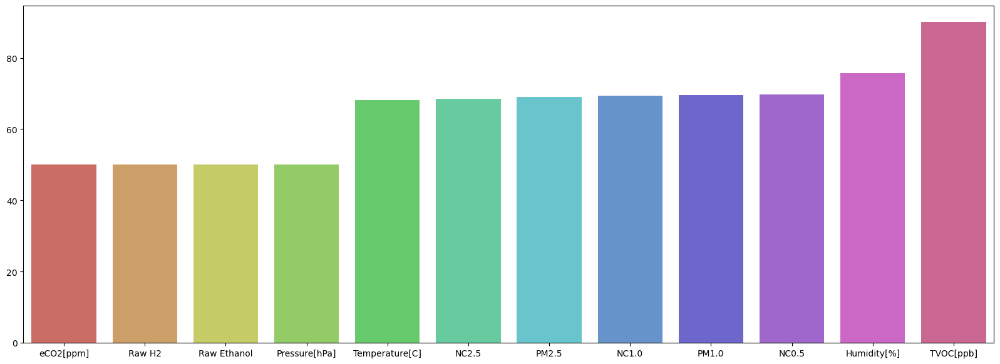

In [249]:
# Let's plot the barchart of different features on
# X-axis and corresponding accuracies on y-axis

sorted_feature_accuracy = {key: value for key, value in sorted(feature_accuracy.items(), key=lambda item: item[1])}
plt.figure(figsize=(20, 7))

# Let's convert the acuuracies into percentages
feature_acc = np.array(list(sorted_feature_accuracy.values())) * 100

sns.barplot(x=list(sorted_feature_accuracy.keys()), y=feature_acc, palette="hls")
plt.savefig("plots/feature_importance.png")
plt.show()

### Observations

1. The smoke detection dataset shows that the "TVOC[ppb]" is the most significant characteristic, and this feature results in a validation accuracy of approximately 0.9029.
2. The smoke detection dataset shows that the "Humidity[%]" and "Raw Ethanol" are the second most significant feature, and this feature results in a validation accuracy of approximately 0.75.
3. The smoke detection dataset shows that the "Pressure[hPa]", "eCO2[ppm]" and "Raw H2" are the least significant features, and these result in a validation accuracy of approximately 0.50

<br></br>
#### Performance trend after removing less significant features

In [250]:
# Let's create the dataframes corresponding to training and validation data
train_dataframe = pd.DataFrame(train_inputs)
valid_dataframe = pd.DataFrame(test_inputs)

# Let's take a quick look at the shape of the train dataframe
print("Train dataframe shape -->", train_dataframe.shape)
print()

# Let's take a quick look at the shape of the valid dataframe
print("Validation dataframe shape -->", valid_dataframe.shape)
print()

Train dataframe shape --> (71610, 12)

Validation dataframe shape --> (17904, 12)



In [251]:
# Let's define the logic to exclude the least important features sequentially
feature_significance = {}

features_list = list(sorted_feature_accuracy.keys())
dataframe_columns = data_frame.columns.tolist()

# Let's iterate over the features and exclude the data corresponding 
# to least important feature and train the model
for index, feature_name in enumerate(features_list):
    model_significance_dict = {}
    if not index == len(sorted_feature_accuracy) - 1:
        least_imp_feature_index = dataframe_columns.index(feature_name)

        train_dataframe.drop(least_imp_feature_index, axis=1, inplace=True)
        valid_dataframe.drop(least_imp_feature_index, axis=1, inplace=True)

    model_significance = Sequential()
    model_significance.add(Dense(32, input_dim=train_dataframe.shape[1], activation="relu"))
    model_significance.add(Dense(128, input_dim=train_dataframe.shape[1], activation="relu"))
    model_significance.add(Dense(64, input_dim=train_dataframe.shape[1], activation="relu"))
    model_significance.add(Dense(32, input_dim=train_dataframe.shape[1], activation="relu"))
    model_significance.add(Dense(1, activation="sigmoid"))

    # Let's build the model using binary_crossentropy as the loss function 
    # and accuracy as the evaluation metric during the compilation process
    model_significance.compile(loss="binary_crossentropy", optimizer = "adam", metrics=["accuracy"])

    callback_a = ModelCheckpoint(
        filepath="models/feature_removal.hdf5",
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True,
        verbose=0
    )
    callback_b = EarlyStopping(
        monitor="val_loss",
        mode="min",
        patience=20,
        verbose=0
    )
    print(f"Let's fit the sequential model excluding {data_frame.columns[least_imp_feature_index]}")
    # Let's fit the sequential model with input features and output label
    history = model_significance.fit(
        x=train_dataframe.values,
        y=train_outputs,
        validation_data=(valid_dataframe.values, test_outputs),
        epochs=150,
        batch_size=100,
        callbacks=[callback_a, callback_b],
        verbose=0
    )

    # Let's precit on the validation inputs
    hypothesis = model_significance.predict(valid_dataframe.values, verbose=0)

    hypothesis = (hypothesis > 0.5)
    accuracy_score = metrics.accuracy_score(test_outputs, hypothesis)
    # model_significance_dict["history"] = history
    feature_significance[f"After removing {data_frame.columns[least_imp_feature_index]}"] = accuracy_score

    print(f"Accuracy score excluding {data_frame.columns[least_imp_feature_index]} --> {accuracy_score}")
    print()

Let's fit the sequential model excluding eCO2[ppm]
Accuracy score excluding eCO2[ppm] --> 0.9947497765862378

Let's fit the sequential model excluding Raw H2
Accuracy score excluding Raw H2 --> 0.9901697944593387

Let's fit the sequential model excluding Raw Ethanol
Accuracy score excluding Raw Ethanol --> 0.9974865951742627

Let's fit the sequential model excluding Pressure[hPa]
Accuracy score excluding Pressure[hPa] --> 0.9934651474530831

Let's fit the sequential model excluding Temperature[C]
Accuracy score excluding Temperature[C] --> 0.9869302949061662

Let's fit the sequential model excluding NC2.5
Accuracy score excluding NC2.5 --> 0.967828418230563

Let's fit the sequential model excluding PM2.5
Accuracy score excluding PM2.5 --> 0.9847520107238605

Let's fit the sequential model excluding NC1.0
Accuracy score excluding NC1.0 --> 0.9840817694369973

Let's fit the sequential model excluding PM1.0
Accuracy score excluding PM1.0 --> 0.9847520107238605

Let's fit the sequential mo

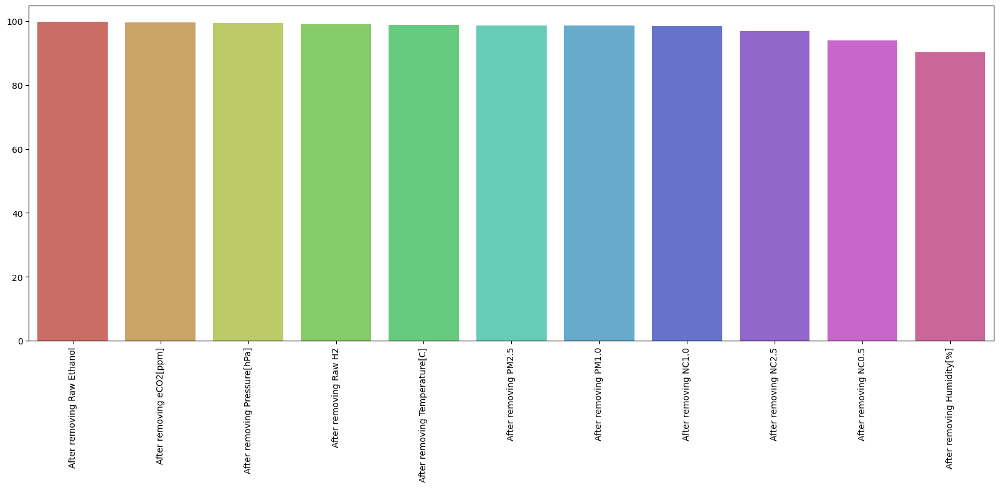

In [252]:
# Let's plot the barchart of different features on
# X-axis and corresponding accuracies on y-axis

sorted_feature_accuracy = {key: value for key, value in sorted(feature_significance.items(), key=lambda item: item[1], reverse=True)}
figure, ax = plt.subplots(figsize=(20, 7))

# Let's convert the acuuracies into percentages
feature_acc = np.array(list(sorted_feature_accuracy.values())) * 100

sns.barplot(x=list(sorted_feature_accuracy.keys()), y=feature_acc, palette="hls")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.savefig("plots/feature_removal.png")
plt.show()

<br></br>
## Bonus Points Activity

<br></br>
### LIME Implementation

In [253]:
# Let's suppress all warnings from lime_tabular
warnings.filterwarnings('ignore', module='lime.lime_tabular')

In [254]:
# Let's initialize a new model instance with best accuracy architecture
model_feature_importance = Sequential()
model_feature_importance.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_feature_importance.add(Dense(128, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_feature_importance.add(Dense(64, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_feature_importance.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
model_feature_importance.add(Dense(1, activation="sigmoid"))

model_feature_importance.compile(
    loss="binary_crossentropy",
    optimizer="adam",
    metrics=["accuracy"]
)

history = model_feature_importance.fit(
    x=train_inputs,
    y=train_outputs,
    validation_data=(test_inputs, test_outputs),
    epochs=100,
    batch_size=128,
    verbose=0
)

In [255]:
# Let's define a predict function to generate a prediction for single datapoint
def predict_fn(x):
    feature_predictions = model_feature_importance.predict(x, verbose=0)
    return feature_predictions

In [256]:
# Let's instantiate the LimeTabularExplainer class with the necessary arguments
explainer = LimeTabularExplainer(
    train_inputs,
    mode="classification",
    feature_names=list(data_frame.columns)[:-1],
    class_names=[0, 1],
    discretize_continuous=False,
    verbose=False
)

In [260]:
# Let's initialize an empty list to store all the explanations
explanations = []

# Let's loop through 5000 random datapoints and generate explanations
for i in range(len(test_inputs[:5000])):
    explainer_object = explainer.explain_instance(
        test_inputs[i],
        predict_fn,
        num_features=train_inputs.shape[0],
        top_labels=1
    )
    explanations.append(explainer_object)

In [261]:
# Let's review the explanations of all the features that correspond to three data points
for index, lime_exp_obj in enumerate(explanations[:3], start=1):
    print(f"================Data Point {index}=================")
    lime_exp_obj.show_in_notebook()

================Data Point 1=================


================Data Point 2=================


================Data Point 3=================


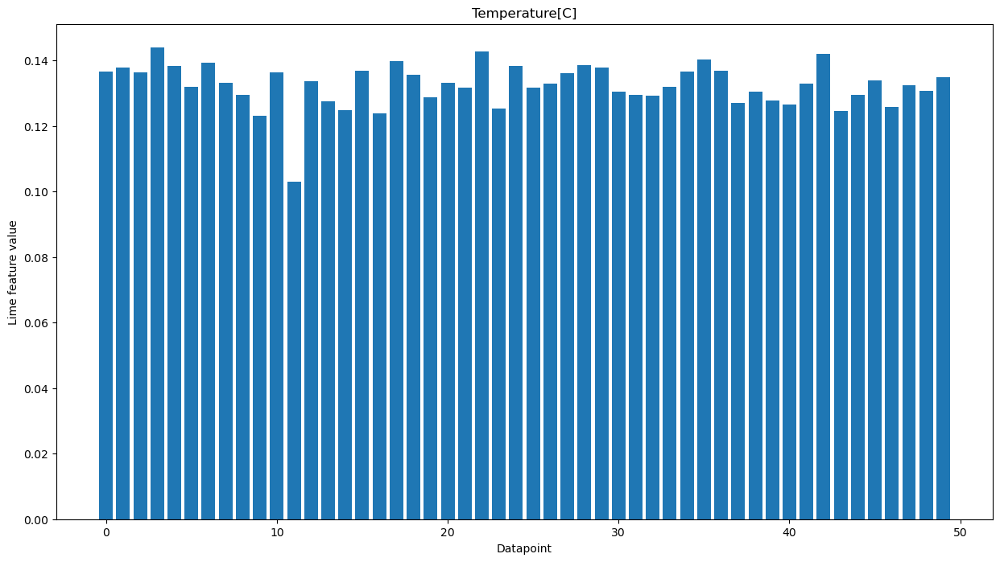

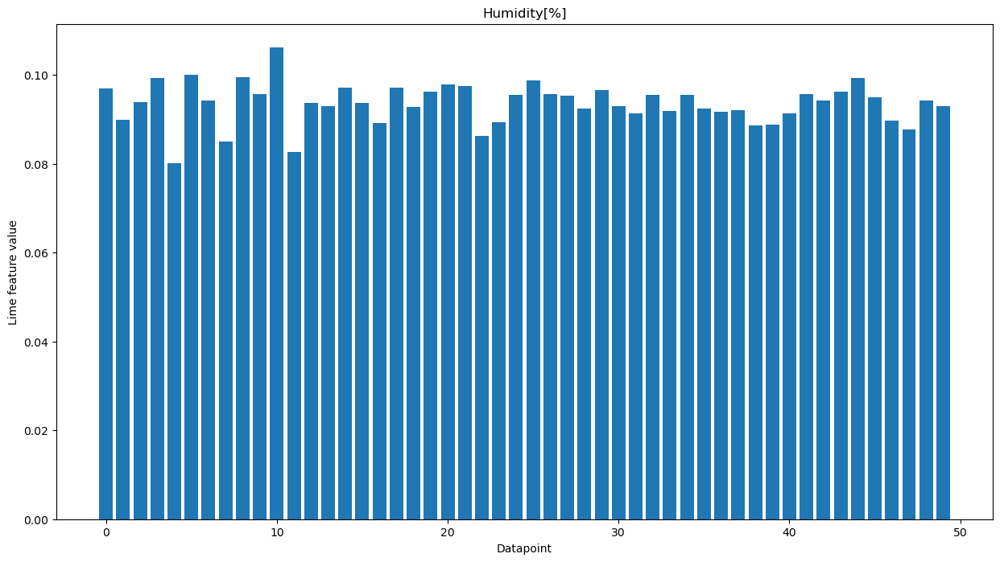

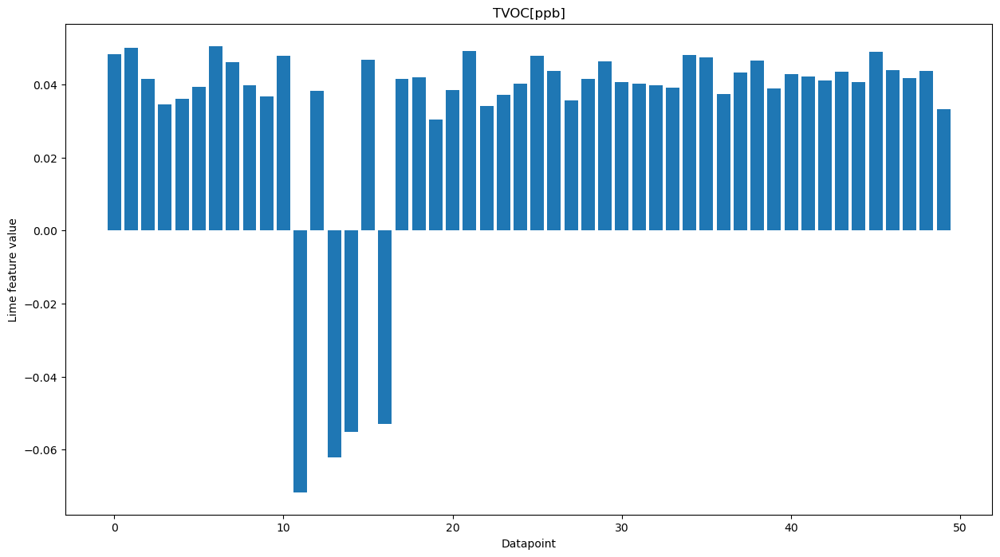

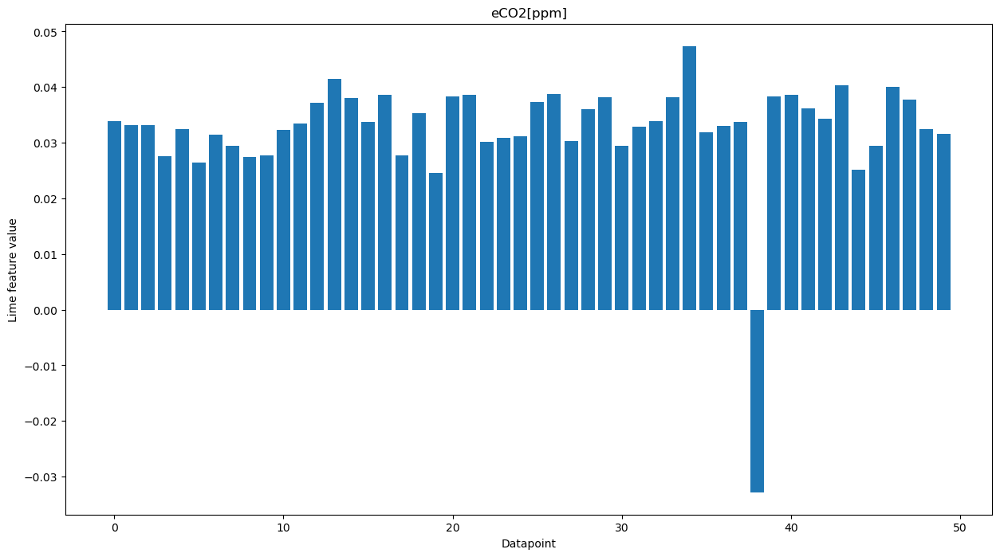

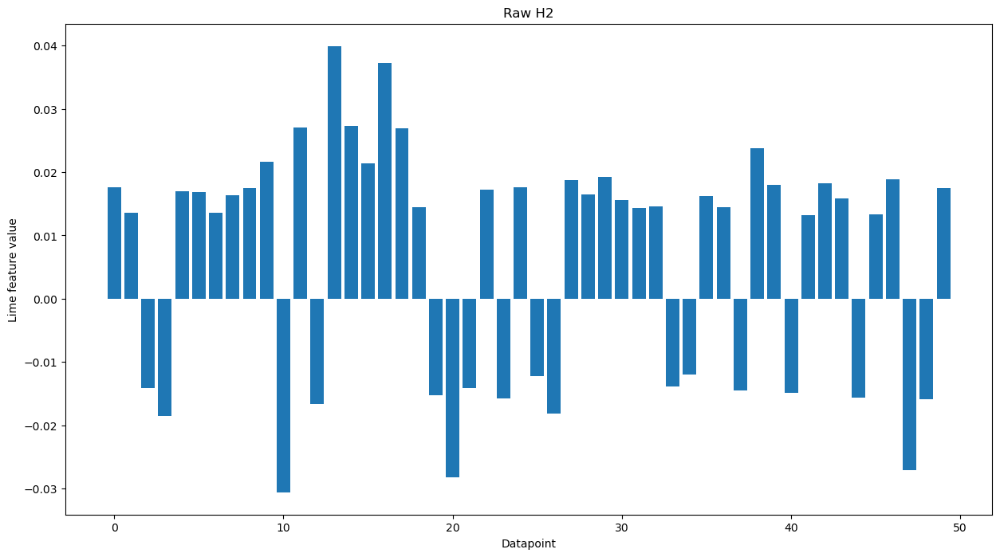

...

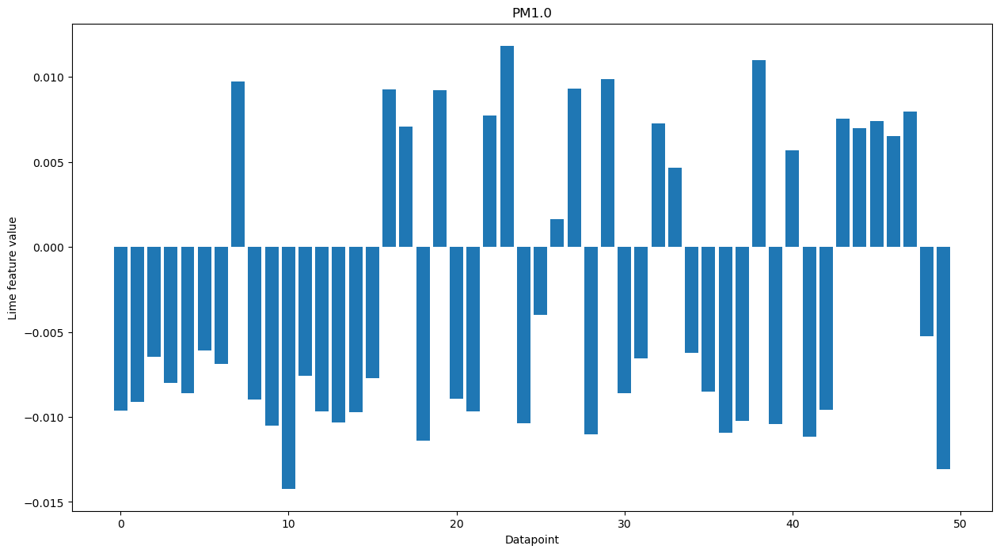

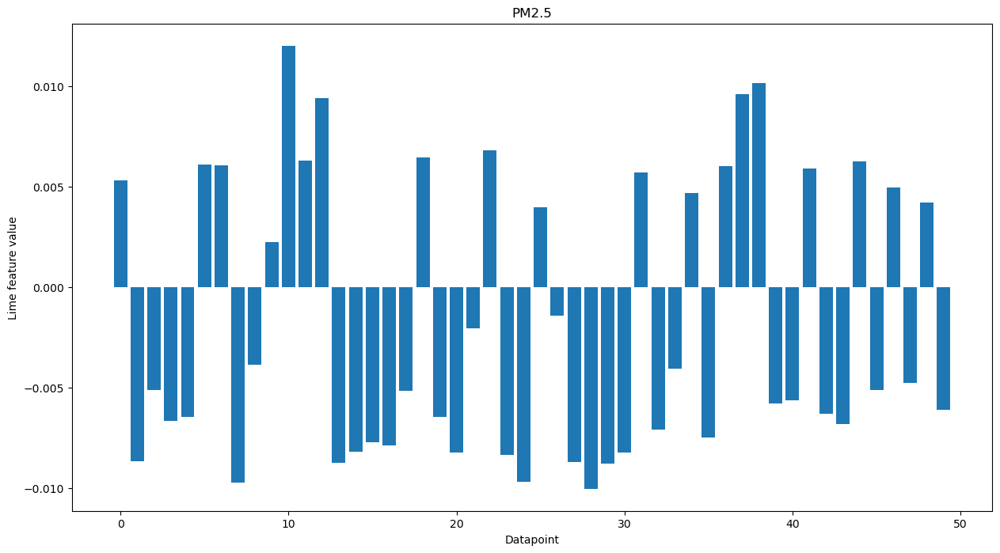

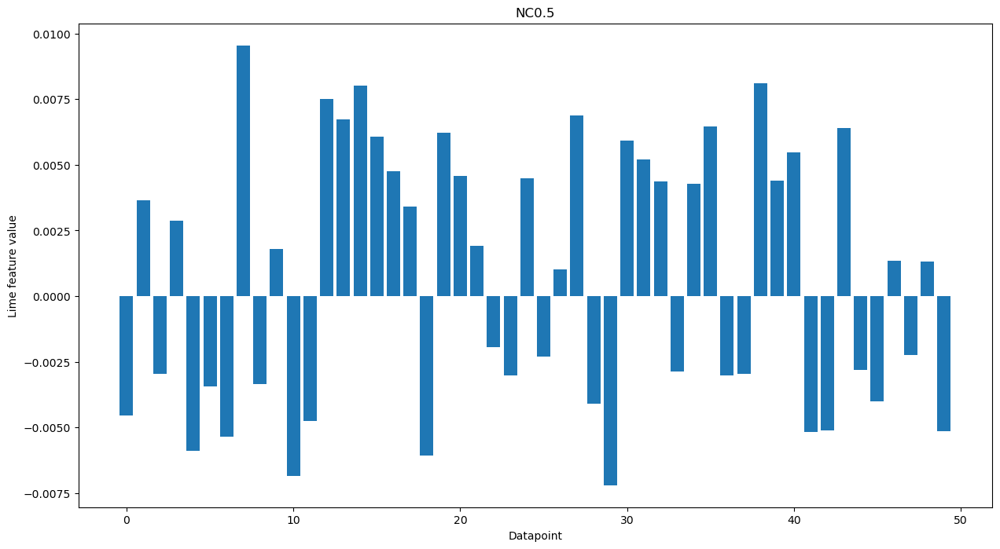

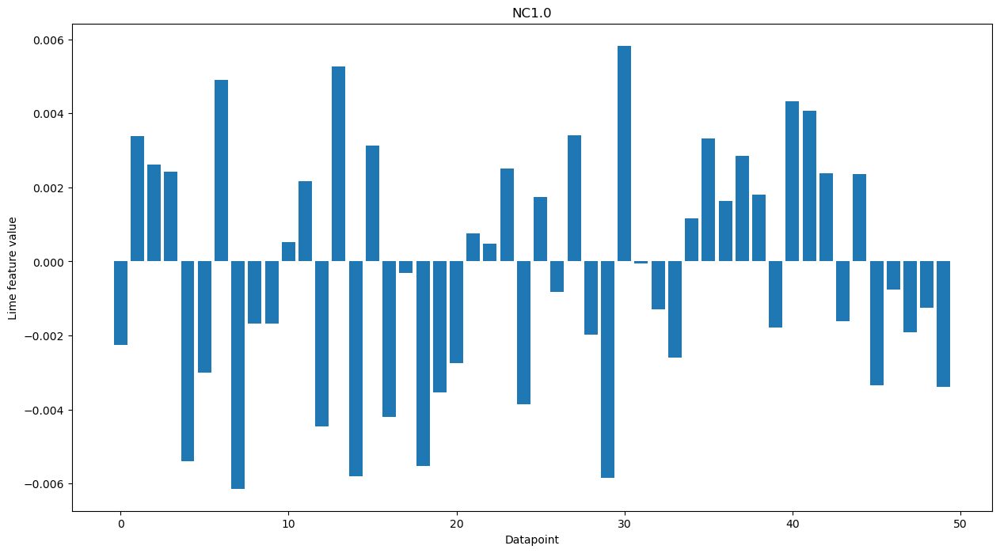

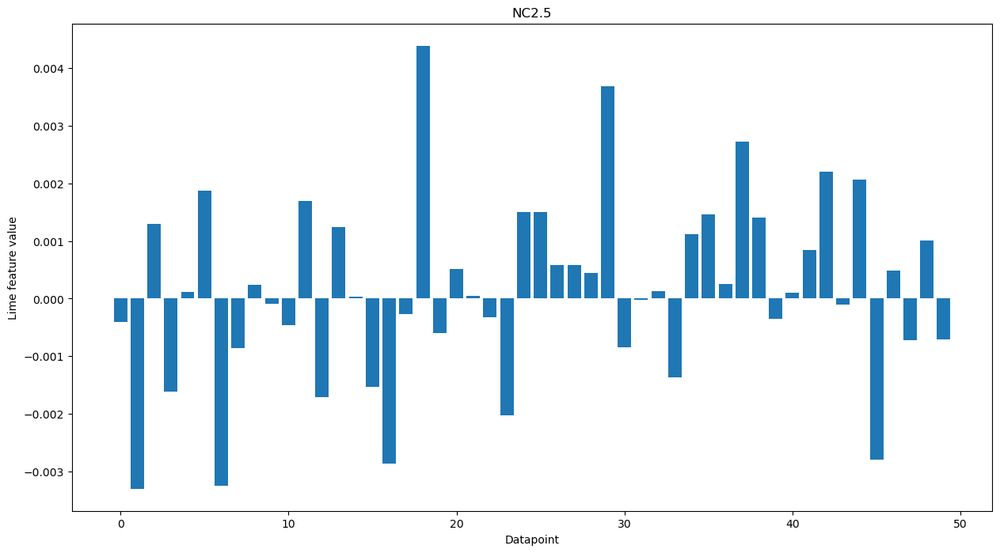

In [262]:
# Let's create a bar chart for each feature
for i, feature_name in enumerate(dataframe_columns[:-1]):
    plt.figure(figsize=(15, 8))
    feature_values = np.array([exp.as_list(0)[i][1] for exp in explanations])
    plt.bar(range(len(feature_values[:50])), feature_values[:50])
    plt.xlabel("Datapoint")
    plt.ylabel("Lime feature value")
    plt.title(feature_name)
    plt.show()

<br></br>
### Shapley Implementation

In [263]:
# Let's initialize a new model instance with best accuracy architecture

shapley_feature_importance = Sequential()
shapley_feature_importance.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
shapley_feature_importance.add(Dense(128, input_dim=data_frame.shape[1] - 1, activation="relu"))
shapley_feature_importance.add(Dense(64, input_dim=data_frame.shape[1] - 1, activation="relu"))
shapley_feature_importance.add(Dense(32, input_dim=data_frame.shape[1] - 1, activation="relu"))
shapley_feature_importance.add(Dense(1, activation="sigmoid"))

# Let's convert the sequential model into a functional API model
input_layer = tf.keras.Input(shape=(data_frame.shape[1] - 1,))
hidden_layer_1 = model.layers[0](input_layer)
hidden_layer_2 = model.layers[1](hidden_layer_1)
hidden_layer_3 = model.layers[2](hidden_layer_2)
hidden_layer_4 = model.layers[3](hidden_layer_3)
output_layer = model.layers[4](hidden_layer_4)
functional_model = tf.keras.Model(inputs=input_layer, outputs=output_layer)

# Let's compile and fit the model
functional_model.compile(loss="binary_crossentropy", optimizer="adam")
functional_model.fit(
    x=train_inputs,
    y=train_outputs,
    epochs=100,
    batch_size=128,
    verbose=0,
    validation_data=(test_inputs, test_outputs)
)

In [264]:
# Let's initialize shap explainer
shapley_explainer = shap.KernelExplainer(functional_model, train_inputs[:5000])

Using 5000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [265]:
# Let's calculate shap values for first 10 samples
shap_values = shapley_explainer.shap_values(test_inputs[:10])

  0%|          | 0/10 [00:00<?, ?it/s]

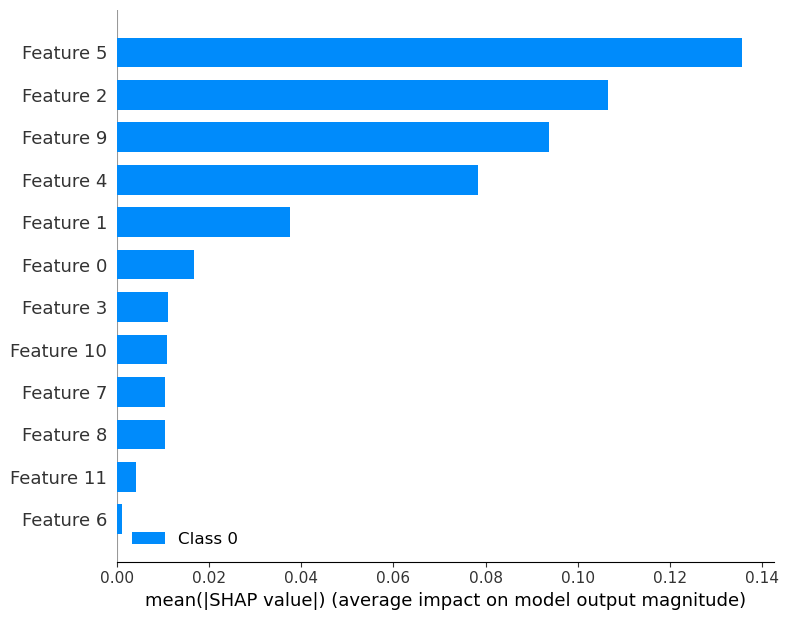

In [267]:
# Let's create a summary plot
shap.summary_plot(shap_values, test_inputs, plot_type="bar")

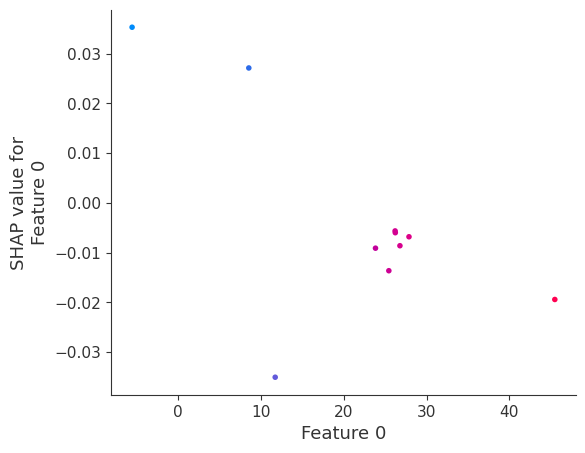

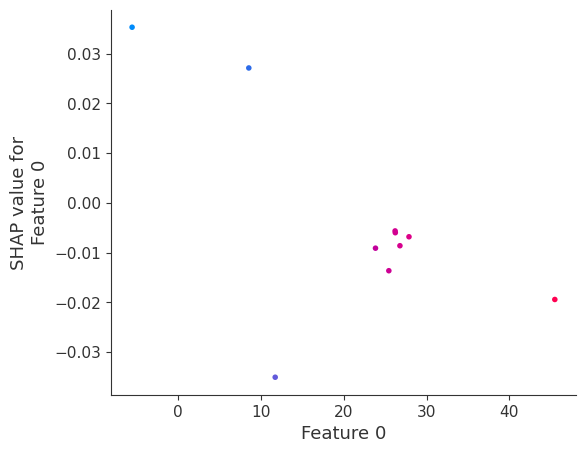

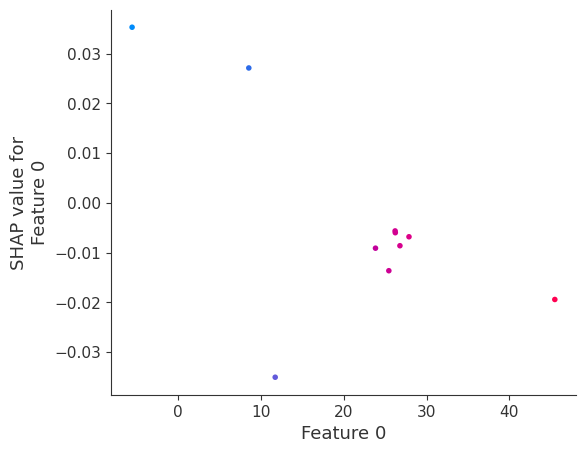

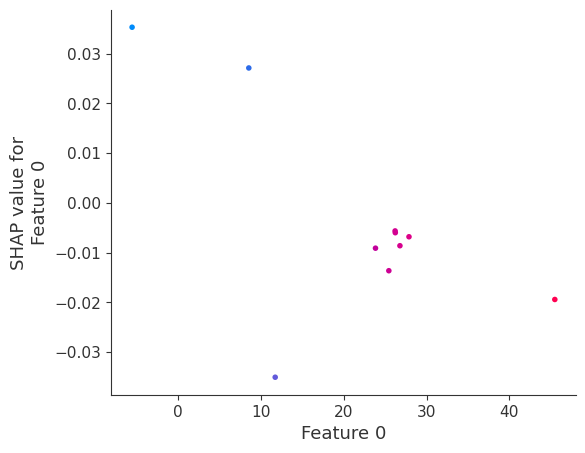

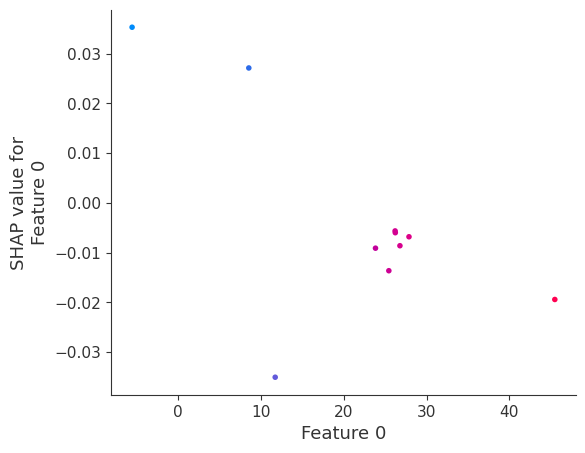

...

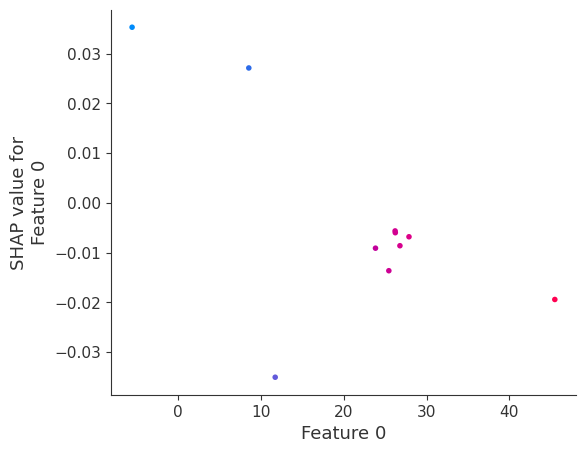

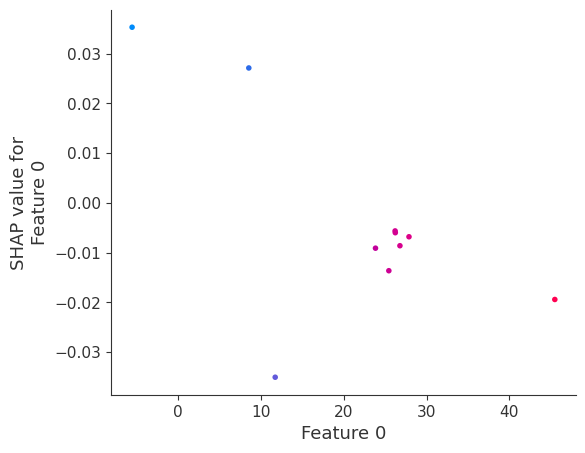

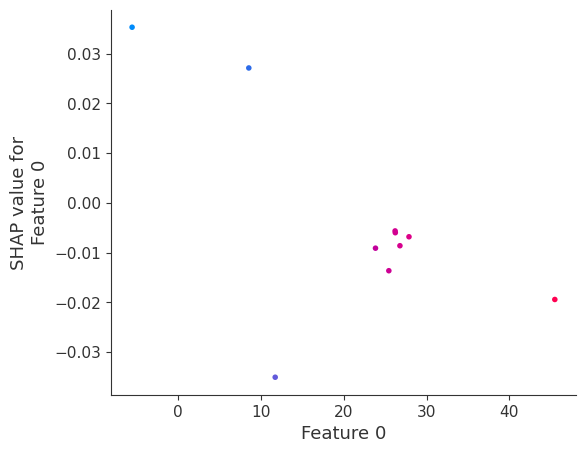

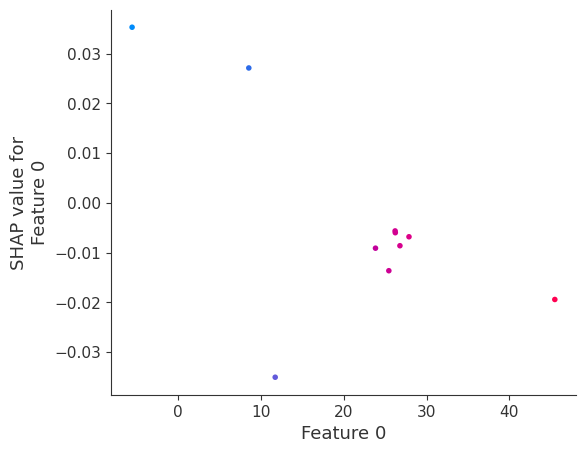

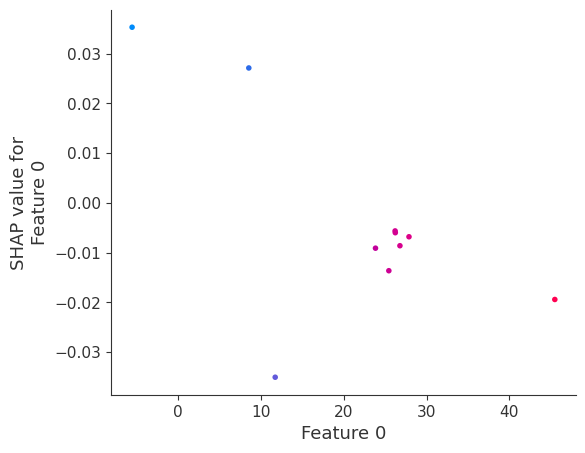

In [276]:
# Let's create a dependence plot for one of the shap values
for index in range(12):
    shap.dependence_plot(0, shap_values[0], test_inputs[:10])